## AUTOMATIC TICKET ASSIGNMENT



### SUMMARY OF PROBLEM STATEMENT, DATA AND FINDINGS




**PROBLEM SYNOPSIS:**



*   **Business Domain:** Incident Management process in an IT function

*   **Purpose:** The main goal of Incident Management process is to provide a quick fix / workarounds or solutions that resolves interruption and restores service to its full capacity to ensure no business impact

*   **Source:** Incidents are created by various stakeholders (Business Users, IT Users and Monitoring Tools) within IT Service Management (ITSM) Tool and assigned to Service Desk teams (L1 / L2 teams)

*   **Workflow:** 

> Incidents from ITSM Tool are assigned to Service Desk teams (L1 / L2 teams)

> This team will review incidents for right ticket categorization, resolve or re-assign to other Functional teams from Applications and Infrastructure (L3 teams) as needed


*  **Workflow Shortcomings:**

> Assignment of incidents to appropriate IT groups is manual process 

> Manual assignment of incidents is inefficient and not cost effective 

>  Human errors during ticket assessment based on description leading to Incidents being assigned to incorrect functional group

> Increases response and resolution times which result in user satisfaction deterioration / poor customer service

##### **PROJECT OBJECTIVE:** Build an automated classifier that can classify tickets to appropriate resolver groups by analyzing text and augment/replace manual ticket categorization process

---




## APPROACH UNDERTAKEN

1.   Explore given Data files to understand structure of data 
and state hypothesis
2. Analyze data distribution patterns, data inconsistencies and text features  influencing incident distribution across groups
3.  Evaluate Hypothesis based on above findings and determine next steps 
4. Text Preprocessing to clean and prepare data for feature extraction
5. Decide which algorithms will be suitable and why?



#### Importing relevant libraries for loading and visualizing data

## Upgrade Gensim

In [ ]:
!pip install --upgrade gensim

Requirement already up-to-date: gensim in /usr/local/lib/python3.6/dist-packages (3.8.3)


## Import Necessary pckages

In [ ]:
# Loading data
import numpy as np
import pandas as pd
%tensorflow_version 2.x
import tensorflow as tf

# Data Visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set_style("darkgrid")

import random
random.seed(0) #Setting random seed for repeatable results

#Gensim packages
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models.wrappers import LdaMallet
from gensim.models.coherencemodel import CoherenceModel
from gensim import similarities


# Ignore the warnings
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

Mount Google Drive and load Excel dataset into Pandas dataframe

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#df=pd.read_excel('/content/drive/MyDrive/AIML Projects/NLP_AutoTicketAssignment/New folder/input_data.xlsx')
df=pd.read_excel("/content/drive/MyDrive/input_data.xlsx")

#### 1. Explore given data files to understand structure of data and state hypothesis


##### 1.a Understand structure of data

In [ ]:
df.info()  # Display basic information about the dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [ ]:
df.isnull().sum() # To check if there are any null values in any of the columns

Short description    8
Description          1
Caller               0
Assignment group     0
dtype: int64

In [ ]:
df #Dataframe head and tail contents

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
...,...,...,...,...
8495,emails not coming in from zz mail,\r\n\r\nreceived from: avglmrts.vhqmtiua@gmail...,avglmrts vhqmtiua,GRP_29
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0
8498,machine nÃ£o estÃ¡ funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62


In [ ]:
df.describe(include='all')

,Short description,Description,Caller,Assignment group
count,8492,8499,8500,8500
unique,7481,7817,2950,74
top,password reset,the,bpctwhsn kzqsbmtp,GRP_0
freq,38,56,810,3976


OBSERVATIONS:


1.   8500 rows and 4 columns with Data type as object


> Short Description and Description fields have mix of human input (emails, messages, etc) and system tool output (alerts, notifications, etc)

> Implication: Since incident description involves human input, grammatical errors, abbreviations, short forms and high degree of variance in text for description fields is expected and also seen.

> 8 null values in Short description and 1 null value in Description fields - These will need to be replaced with NAN

2. Caller field is not relavant for classification and can be dropped. 

3. Data transformation steps needed fr Description fields:
> Remove caller names to avoid verbose
> Visual inspection shows non-english language, symbols, spaces, junk characters and presence of usernames, Email ID, greetings,system acronyms, application names is expected in the description fields - These will need to be handled during pre-processing
> Duplicate fields will need to be removed thereafter

4. 74 Assigment Groups need to be analysed further to determine if this column can be used for classification 



##### 1.b Stating HYPOTHESIS

*   Given dataset lacks important information provided by ITSM tools such as Incident Severity and SLA Priority which are primarily used for assigning tickets to different functional groups

*   Absence of above information prompts us to assume that given Group Sructure of 74 groups is accurate and below hypothesis will be need to be proved to permit use of 'Assignment Group' as Target column for classification purposes:
 > Each group has distinct type of incidents. There is minimal/no overlap of incidents across groups 

 > Incident distribution across groups (aka classes) should not have significant imbalance 


#### 2. Analyze data distribution patterns, data inconsistencies and text features influencing incident distribution across groups

##### 2.a Analyzing group structure to determine data distribution

In [ ]:
df['Assignment group'].unique() # Display unique group names 

array(['GRP_0', 'GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7',
       'GRP_8', 'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73'],
      dtype=object)

In [ ]:
df_grp = df['Assignment group'].value_counts().reset_index() # Get counts based on assignment group
df_grp['percentage'] = (df_grp['Assignment group']/df_grp['Assignment group'].sum())*100  # Calculate percentage based on the counts
df_grp

,index,Assignment group,percentage
0,GRP_0,3976,46.776471
1,GRP_8,661,7.776471
2,GRP_24,289,3.400000
3,GRP_12,257,3.023529
4,GRP_9,252,2.964706
...,...,...,...
69,GRP_35,1,0.011765
70,GRP_61,1,0.011765
71,GRP_70,1,0.011765
72,GRP_67,1,0.011765


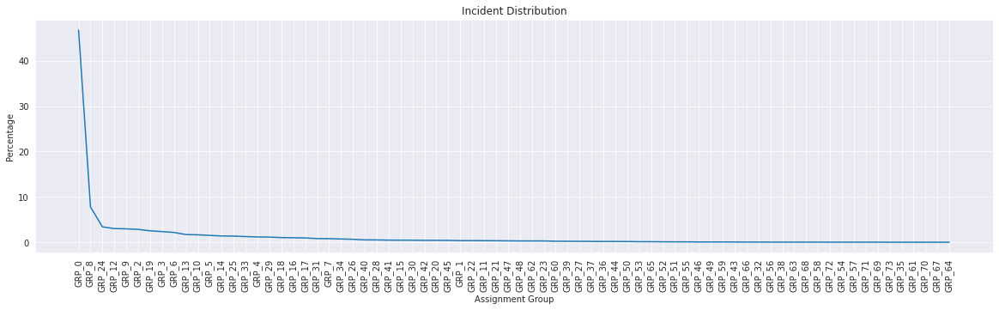

In [ ]:
# View the distribution of incidents in every assignment group
plt.subplots(figsize = (20,5))
plt.plot(df_grp["index"], df_grp["percentage"]) 
plt.xlabel('Assignment Group') 
plt.ylabel('Percentage') 
plt.xticks(rotation=90)
plt.title('Incident Distribution')
plt.show()

In [ ]:
df_tickets = pd.DataFrame(columns=['Description','Ticket Count'])
oneticket = {'Description':'1 ticket','Ticket Count':len(df_grp[df_grp['Assignment group'] < 2])}
_10ticket = {'Description':'< 10 tickets','Ticket Count':len(df_grp[(df_grp['Assignment group'] > 1)& (df_grp['Assignment group'] < 11) ])}
_50ticket = {'Description':'< 50 tickets','Ticket Count':len(df_grp[(df_grp['Assignment group'] > 10)& (df_grp['Assignment group'] < 51)])}
_100ticket = {'Description':'< 100 tickets','Ticket Count':len(df_grp[(df_grp['Assignment group'] > 50)& (df_grp['Assignment group'] < 101)])}
_100plusticket = {'Description':' > 100 tickets','Ticket Count':len(df_grp[(df_grp['Assignment group'] > 100)])}
#append row to the dataframe
df_tickets = df_tickets.append([oneticket,_10ticket,_50ticket,_100ticket,_100plusticket], ignore_index=True)
df_tickets
# This is to display and get understanding on how many tickets per assignment group we have in our dataframe

,Description,Ticket Count
0,1 ticket,6
1,< 10 tickets,19
2,< 50 tickets,25
3,< 100 tickets,9
4,> 100 tickets,15


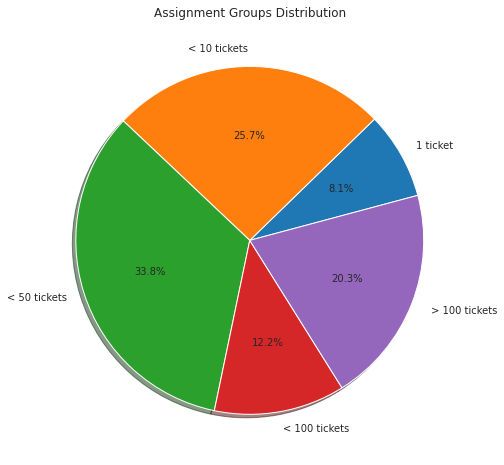

In [ ]:
plt.figure(figsize=(10, 8))
plt.pie(df_tickets['Ticket Count'],labels=df_tickets['Description'],autopct='%1.1f%%', startangle=15, shadow = True);
plt.title('Assignment Groups Distribution');

**OBSERVATIONS:**

1. Incident distribution across Groups is highly imbalanced
> GRP_0 @ ~47% , GRP_8 @ 8%, Majority groups averaging below 3% with some of them under 1% 

2. Distribution of the tickets across groups
 > 25 Groups range between 1 - 10 tickets

 > 25 Groups range between in 10 - 50 tickets

 > 9 Groups  range between 50 - 100 tickets

 > 15 Group has 100+ tickets


##### 2.b Resolve Text (data) inconsistencies in description fields influencing Incident distribution pattern across groups

2.b.1 Removing presence of null values

In [ ]:
df[df.isnull().any(axis=1)]

,Short description,Description,Caller,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [ ]:
#Replace NaN values with empty strings
df.replace(np.NaN," ", inplace=True)

df.isnull().sum()

Short description    0
Description          0
Caller               0
Assignment group     0
dtype: int64

 2.b.2 Removing presence of caller fields in Short Description and Description fields

*Renaming columns*

In [ ]:
#rename the columns
df.rename(columns = {"Assignment group" :"Group", "Short description": "Short_description"}, inplace=True)

Identify

In [ ]:
#Find the maximum number of words in the caller name
print("Maximum number of words in the caller name : {}".format(max(df['Caller'].apply(lambda x: len(x.split())))))
# Add a column to indicate if the caller name is present in the Short_description column
df['Caller_in_SD'] = df.apply(lambda x: True if x.Caller.split()[0] in x.Short_description else True if x.Caller.split()[1] in x.Short_description else False, axis=1)
print("Number of rows in short description having caller name:{}".format(len(df[df['Caller_in_SD'] == True])))
# Add a column to indicate if the caller name is present in the Description column
df['Caller_in_Desc'] = df.apply(lambda x: True if x.Caller.split()[0] in x.Description else True if x.Caller.split()[1] in x.Description else False, axis=1)
print("Number of rows in description having caller name:{}".format(len(df[df['Caller_in_Desc'] == True])))

Maximum number of words in the caller name : 2
Number of rows in short description having caller name:381
Number of rows in description having caller name:1839


Replace

In [ ]:
# replace first and second name with null string in Short Description column
df['SD_no_Caller'] = df.apply(lambda x : x['Short_description'].replace(str(x['Caller']).split()[0], ''), axis=1)
df['SD_no_Caller'] = df.apply(lambda x : x['SD_no_Caller'].replace(str(x['Caller']).split()[1], ''), axis=1)

# # replace first and second name with null string in Description column
df['Desc_no_Caller'] = df.apply(lambda x : x['Description'].replace(str(x['Caller']).split()[0], ''), axis=1)
df['Desc_no_Caller'] = df.apply(lambda x : x['Desc_no_Caller'].replace(str(x['Caller']).split()[1], ''), axis=1)

print("Count of Caller names in Short_description column : {}".format(df.apply(lambda x: True if x.Caller.split()[0] in x.SD_no_Caller else True if x.Caller.split()[1] in x.SD_no_Caller else False, axis=1).sum()))
print("Count of Caller names in Description column : {}".format(df.apply(lambda x: True if x.Caller.split()[0] in x.Desc_no_Caller else True if x.Caller.split()[1] in x.Desc_no_Caller else False, axis=1).sum()))

Count of Caller names in Short_description column : 0
Count of Caller names in Description column : 0


Verify

In [ ]:
# Checking if Caller names have been removed from Short_description column
print("Original Short_description, without removing caller name: ", df['Short_description'].iloc[8447])
print("\nAfter removing caller name: ", df['SD_no_Caller'].iloc[8447])
print("*********************************************************")
# Checking if Caller names have been removed from Description column
print("Original Description, without removing caller name: ", df['Description'].iloc[8495])
print("\nAfter removing caller name : ", df['Desc_no_Caller'].iloc[8495])

Original Short_description, without removing caller name:  reset the password for obvyknzx gzvjtish on erp / production / erp

After removing caller name:  reset the password for   on erp / production / erp
*********************************************************
Original Description, without removing caller name:  

received from: avglmrts.vhqmtiua@gmail.com

good afternoon,
i am not receiving the emails that i sent from zz mail.
please advise



After removing caller name :  

received from: .@gmail.com

good afternoon,
i am not receiving the emails that i sent from zz mail.
please advise




*Drop columns*

In [ ]:
df.drop(['Caller','Caller_in_SD','Caller_in_Desc'], axis = 1, inplace=True)
#Removing caller column and temporary columns (Caller_in_SD,Caller_in_Desc) which was created to evaluate the presence of caller names in short description and description
df.describe(include='all')

,Short_description,Description,Group,SD_no_Caller,Desc_no_Caller
count,8500,8500,8500,8500,8500
unique,7482,7818,74,7362,7764
top,password reset,the,GRP_0,reset passwords for using password_managemen...,the
freq,38,56,3976,61,56


**OBSERVATIONS**: 

As anticipated, after removing Caller names, number of duplicates in SD_no_Caller and Desc_no_caller have increased. It is desirable to analyze text in ticket distribution across groups and consider unique ones.

Other cleanup such as email ids and greetings, etc will be handleld downstream during Data Cleansing and removal of Stop words sections. This is being done to reduce noise and keep relevant words in the corpus and thereby reduce the Vocabulaory size that impacts text classification techniques


 2.b.3 Detecting presence of unrecognized unicode characters and Non-engish language in Description fields and converting them into English to refine the dataset

Detection

In [ ]:
# https://pypi.org/project/ftfy/
# ftfy: fixes text for you : We intend to use this to address certain special characters in description*
# The goal of ftfy is to take in bad Unicode and output good Unicode, for use in Unicode-aware code. 

!pip install ftfy

In [ ]:
from ftfy import fix_encoding, fix_text
# Sanitize the dataset using ftfy
df['SD_clean'] = df['SD_no_Caller'].apply(fix_text)
df['Desc_clean'] = df['Desc_no_Caller'].apply(fix_text)
df.iloc[7586]

Short_description    windows ç³»ç»Ÿæ— æ³•ç™»å½•æç¤ºè®¡ç®—æœºä¸Žä¸...
Description          windows ç³»ç»Ÿæ— æ³•ç™»å½•æç¤ºè®¡ç®—æœºä¸Žä¸...
Group                                                           GRP_31
SD_no_Caller         windows ç³»ç»Ÿæ— æ³•ç™»å½•æç¤ºè®¡ç®—æœºä¸Žä¸...
Desc_no_Caller       windows ç³»ç»Ÿæ— æ³•ç™»å½•æç¤ºè®¡ç®—æœºä¸Žä¸...
SD_clean                                windows 系统无法登录提示计算机与主域之前信任关系失败
Desc_clean                              windows 系统无法登录提示计算机与主域之前信任关系失败
Name: 7586, dtype: object

In [ ]:
# https://pypi.org/project/polyglot
# Language detection using polyglot
# Polyglot is a natural language pipeline that supports massive multilingual applications
!pip install -q pyicu
!pip install -q pycld2
!pip install -q polyglot
!pip install -q textstat

In [ ]:
from polyglot.detect import Detector
import textstat
from tqdm import tqdm
import matplotlib.cm as cm
tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

In [ ]:
def get_language(text):
    return Detector("".join(x for x in text if x.isprintable()), quiet=True).languages[0].name

df["lang"] = df["Desc_clean"].progress_apply(get_language)

  0%|          | 0/8500 [00:00<?, ?it/s]Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the languag

In [ ]:
lang_list = sorted(list(set(df["lang"])))
counts = [list(df["lang"]).count(cont) for cont in lang_list]
df2 = pd.DataFrame(np.transpose([lang_list, counts]))
df2.columns = ["Language", "Count"]
df2["Count"] = df2["Count"].apply(int)

df2_en = pd.DataFrame(np.transpose([["English", "Non-English"], [max(counts), sum(counts) - max(counts)]]))
df2_en.columns = ["Language", "Count"]

fig = px.bar(df2_en, x="Language", y="Count", title="Language of comments", color="Language", text="Count")
fig.update_layout(template="plotly_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig.data[0].textfont.color = "black"
fig.data[0].textposition = "outside"
fig.data[1].textfont.color = "black"
fig.data[1].textposition = "outside"
fig

In [ ]:
df["lang"].unique()

array(['English', 'Latin', 'Kinyarwanda', 'Malay', 'Chinese', 'German',
       'Scots', 'Dutch', 'Welsh', 'Norwegian Nynorsk', 'Polish', 'Danish',
       'un', 'Portuguese', 'Japanese', 'Malagasy', 'Icelandic', 'Tagalog',
       'Nauru', 'Luxembourgish', 'Spanish', 'Turkish', 'Waray', 'Finnish',
       'Interlingua', 'Hungarian', 'French', 'Norwegian', 'Latvian'],
      dtype=object)

**OBSERVATIONS:**

1.  There is presence of multiple non english languages
2.  For converting them into english language we can use Google Translate API, however there is limit imposed from Google on number of requests for any unpaid service, so this cannot be used. 
3.  Due to the above limitation we will go for offline approach and convert the text from non english to english.

**CONVERSION TO ENGLISH LANGUAGE -**

*   We have used translate feature within GOOGLE SHEETS offline to 
translate into 'English' language

> New input file "input_data_Translate_v1.xlsx" has been generated.

In [ ]:
# Load the Translated sheet
#df_translated = pd.read_excel('/content/drive/MyDrive/AIML Projects/NLP_AutoTicketAssignment/New folder/input_data_Translate_v1.xlsx')
df_translated = pd.read_excel('/content/drive/MyDrive/input_data_Translate_v1.xlsx')

In [ ]:
# Verify that GOOGLE SHEETS has translated these instances correctly
df_translated.iloc[7586]

Short_description       windows ç³»ç»Ÿæ— æ³•ç™»å½•æç¤ºè®¡ç®—æœºä¸Žä¸...
Description             windows ç³»ç»Ÿæ— æ³•ç™»å½•æç¤ºè®¡ç®—æœºä¸Žä¸...
Group                                                              GRP_31
SD_no_Caller            windows ç³»ç»Ÿæ— æ³•ç™»å½•æç¤ºè®¡ç®—æœºä¸Žä¸...
Desc_no_Caller          windows ç³»ç»Ÿæ— æ³•ç™»å½•æç¤ºè®¡ç®—æœºä¸Žä¸...
SD_clean                                   windows 系统无法登录提示计算机与主域之前信任关系失败
Desc_clean                                 windows 系统无法登录提示计算机与主域之前信任关系失败
SD_clean_translate      windows system can not login prompt before the...
Desc_clean_translate    windows system can not login prompt before the...
Name: 7586, dtype: object

2.b.4 Data Cleaning : 
> Removing presence of unnecessary verbose, greetings, email IDs, punctuations tags, dates and numbers. This will refine the text in Description fields.
> This cleanup shall help in refining the text content of the incidents, detect and remove additional duplicates. 

Data Cleansing

In [ ]:
import re
from dateutil import parser

def is_valid_date(date_str):
    try:
        parser.parse(date_str)
        return True
    except:
        return False

def clean_text(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text=text.lower()
    text = ' '.join([w for w in text.split() if not is_valid_date(w)])
    
    # Below is in addition to STOP Words, to exclude continuous words/phrases/sentences for our problem statement These would have added to vocab size without contributing to the classification
    text=text.replace(('first name: ').lower(),'firstname')
    text=text.replace(('last name: ').lower(),'lastname')
    text=text.replace(('received from:').lower(),'')
    text=text.replace('email:','')
    text=text.replace('email address:','') 
    index1=text.find('from:')
    index2=text.find('\nsddubject:')
    text=text.replace(text[index1:index2],'')
    index3=text.find('[cid:image')
    index4=text.find(']')
    text=text.replace(text[index3:index4],'')
    text=text.replace('subject:','')
    text=text.replace('this communication is intended solely for the use of the addressee and may contain information that is worthy of protection, confidential or excluded from disclosure under applicable law. the distribution, distribution or reproduction of this communication by persons other than the intended recipients is strictly prohibited. if you have received this message by mistake, please notify the sender and delete this message.','')
    text=text.replace('how to','')
    #text=text.replace('danke','')
    #text=text.replace('hallo','')
    #text=text.replace('mr','')
    #text=text.replace('sir','')
    #text=text.replace('ignore','')            
    text=text.replace('please ignore','')            
    #text=text.replace('pls','')    
    text=text.replace('mailto','')            
    text=text.replace('company shared services gmbh','')                            
    text=text.replace('company infrastructure gmbh','')                            
    text=text.replace('good afternoon','')
    text=text.replace('this message was sent from an unmonitored email address', '')
    text=text.replace('please do not reply to this message', '')
    text=text.replace('monitoring_tool@company.com','MonitoringTool')
    text=text.replace('select the following link to view the disclaimer in an alternate language','')
    text=text.replace('description problem', '') 
    text=text.replace('steps taken far', '')
    text=text.replace('customer job title', '')
    text=text.replace('sales engineer contact', '')
    text=text.replace('description of problem:', '')
    text=text.replace('steps taken so far', '')
    text=text.replace('please do the needful', '')
    text=text.replace('please note that ', '')
    text=text.replace('please find below', '')
    #text=text.replace('dear', '')
    #text=text.replace('urgent', '')
    text=text.replace('date and time', '')
    text=text.replace('kindly refer mail', '')
    text=text.replace('name:', '')
    text=text.replace('language:', '')
    text=text.replace('customer number:', '')
    text=text.replace('telephone:', '')
    text=text.replace('summary:', '')
    text=text.replace('sincerely', '')
    text=text.replace('company inc', '')
    text=text.replace('importance:', '')
    text=text.replace('@gmail.com', '')
    text=text.replace('company.com', '')
    text=text.replace('microsoftonline.com', '')
    text=text.replace('company.onmicrosoft.com', '')
    #text=text.replace('hello', '')
    text=text.replace('hi it team', '')
    text=text.replace('hi team', '')
    #text=text.replace('team', '')
    #text=text.replace('hi', '')
    #text=text.replace('best', '')
    #text=text.replace('kind', '')
    #text=text.replace('regards', '')
    text=text.replace('good morning', '')
    #text=text.replace('please', '')
    #text=text.replace('cant', '')
    text=text.replace('etc', '')
    #text=text.replace('cr', '')
    #text=text.replace('ba', '')
    #text=text.replace('pdf', '')
    text=text.replace('hxgaycze', '')
    text=text.replace('hlanwgqj', '')
    text=text.replace('thanks', '')
    text=text.replace('fgxprnub', '')
    text=text.replace('ndigung', '')
    text=text.replace('greeting', '')
    text=text.replace('friendly', '')
    text=text.replace('hlanwgqj', '')
    text=text.replace('tgryhu', '')
    text=text.replace('hgygrtui', '')
    #text=text.replace('kw', '')
    text=text.replace('hxgayczeing', '')
    text=text.replace('uacyltoe', '')
    text=text.replace('mikhghytr', '')
    text=text.replace('wafglhdrhjop', '')
    text=text.replace('office365', 'office')
    text=text.replace('office2010', 'office')

    #text=text.replace('etcs', '')
    #text=text.replace('sr', '')
    #text=text.replace('sorry', '')
    #text=text.replace('manager', '')
        
    
    #Remove email 
    text = re.sub(r'\S*@\S*\s?', '', text)
    # Remove numbers 
    #text = re.sub(r'\d+','' ,text)
    # Remove new line characters 
    text = re.sub(r'\n',' ',text)
    # Remove hashtag while keeping hashtag text
    text = re.sub(r'#','', text)
    text = re.sub(r'&;?', 'and',text)
    # Remove HTML special entities (e.g. &amp;)
    text = re.sub(r'\&\w*;', '', text)
    # Remove hyperlinks
    text = re.sub(r'https?:\/\/.*\/\w*', '', text)  
    # Remove characters beyond Readable formart by Unicode:
    text= ''.join(c for c in text if c <= '\uFFFF') 
    text = text.strip()
    # Remove unreadable characters  (also extra spaces)
    text = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text).split())
    # Remove Numbers
    text = re.sub(r"\s+[a-zA-Z]\s+", ' ', text)
    # Remove single characters
    text =  re.sub(r"\b[a-zA-Z]\b", ' ', text)
    #text = re.sub(' +', ' ', text)
    # initializing punctuations string  
    punc = '''!()-[]{};:'",<>./?@#$%^&*~'''
    # Removing punctuations in string 
    for ele in text:
      if ele in punc:
        text = text.replace(ele, "")      

    return text


# Removing more than 2 repeated characters in the text [eg: Finallly will change to Finally]
def reduce_lengthening(text):
  pattern = re.compile(r"(.)\1{2,}")
  return pattern.sub(r"\1\1", text)

**IMPLICATION:**  - Replacing text is in addition to STOP Words, to exclude continuous words/phrases/sentences for our problem statement These would have added to vocab size without contributing to the classification

In [ ]:
#Fill 'Short_Description' field entries that have null with blank space
df_translated['SD_clean_translate'].fillna(value=' ', inplace=True)

#Fill 'Description' field entries that have null with blank space
df_translated['Desc_clean_translate'].fillna(value=' ', inplace=True)

In [ ]:
df_translated['SD_clean'] = df_translated['SD_clean_translate'].apply(lambda x: clean_text(x))

df_translated['Desc_clean'] = df_translated['Desc_clean_translate'].apply(lambda x: clean_text(x))

In [ ]:
print(df_translated[['SD_clean_translate','SD_clean']].iloc[7387])#281

print(df_translated[['Desc_clean_translate','Desc_clean']].iloc[7387])#281

SD_clean_translate    unable to connect to companysecure at usa, oh
SD_clean               unable to connect to companysecure at usa oh
Name: 7387, dtype: object
Desc_clean_translate    contact # \nno one at the site is able to conn...
Desc_clean              contact no one at the site is able to connect ...
Name: 7387, dtype: object


In [ ]:
df_translated[['SD_clean_translate','SD_clean','Desc_clean_translate','Desc_clean']].describe().T

,count,unique,top,freq
SD_clean_translate,8500,7262,reset passwords for using password_managemen...,61
SD_clean,8500,6701,reset passwords for using password management ...,61
Desc_clean_translate,8500,7694,the,56
Desc_clean,8500,6961,,121


**OBSERVATIONS**: 

As anticipated, after data cleansing, number of duplicates in SD_clean and Desc_clean columns have increased. These will be removed downstream

**IMPLICATION**: Data Cleansing has cleaned unecessary words, pucntuation marks, tags, email IDs. This will help in reducing the vocabulaory size - Avoids curse of dimensionality as well as aids in text classification

**SPELL CHECKER**
 - We explored Spell checker (pyChecker) for corrrecting some of the misspeld words identified during visual inspection eg: 'Laoding' , etc

  - It was very time consuming using this package in the available time to submit the EDA and we will need to expolore other options like (symspell - faster and needs less memory) to correct spellings in the coming weeks. 

**IMPLICATION:** Spell check will retain the accurate words. Will additionally help in reducing the vocabulary size as Lemmatization of the words will be more acurate.

In [ ]:
#This Notebook has been released under the Apache 2.0 open source license.
#Download Code
"""
The spell checker has been entirely ripped off of this script by Serg Lavrikov(rumbok):
https://www.kaggle.com/rumbok/ridge-lb-0-41944

do check it out, its a work of art.

caveat: script consumes a lot of memory but is much faster than Norvig's spell checker (1 million times)
http://blog.faroo.com/2015/03/24/fast-approximate-string-matching-with-large-edit-distances/
"""

import re, random
import spacy
nlp = spacy.load('en')

to_sample = False # if you're impatient switch this flag

def spacy_tokenize(text):
    return [token.text for token in nlp.tokenizer(text)]
    
def dameraulevenshtein(seq1, seq2):
    """Calculate the Damerau-Levenshtein distance between sequences.
    This method has not been modified from the original.
    Source: http://mwh.geek.nz/2009/04/26/python-damerau-levenshtein-distance/
    This distance is the number of additions, deletions, substitutions,
    and transpositions needed to transform the first sequence into the
    second. Although generally used with strings, any sequences of
    comparable objects will work.
    Transpositions are exchanges of *consecutive* characters; all other
    operations are self-explanatory.
    This implementation is O(N*M) time and O(M) space, for N and M the
    lengths of the two sequences.
    >>> dameraulevenshtein('ba', 'abc')
    2
    >>> dameraulevenshtein('fee', 'deed')
    2
    It works with arbitrary sequences too:
    >>> dameraulevenshtein('abcd', ['b', 'a', 'c', 'd', 'e'])
    2
    """
    # codesnippet:D0DE4716-B6E6-4161-9219-2903BF8F547F
    # Conceptually, this is based on a len(seq1) + 1 * len(seq2) + 1 matrix.
    # However, only the current and two previous rows are needed at once,
    # so we only store those.
    oneago = None
    thisrow = list(range(1, len(seq2) + 1)) + [0]
    for x in range(len(seq1)):
        # Python lists wrap around for negative indices, so put the
        # leftmost column at the *end* of the list. This matches with
        # the zero-indexed strings and saves extra calculation.
        twoago, oneago, thisrow = (oneago, thisrow, [0] * len(seq2) + [x + 1])
        for y in range(len(seq2)):
            delcost = oneago[y] + 1
            addcost = thisrow[y - 1] + 1
            subcost = oneago[y - 1] + (seq1[x] != seq2[y])
            thisrow[y] = min(delcost, addcost, subcost)
            # This block deals with transpositions
            if (x > 0 and y > 0 and seq1[x] == seq2[y - 1]
                    and seq1[x - 1] == seq2[y] and seq1[x] != seq2[y]):
                thisrow[y] = min(thisrow[y], twoago[y - 2] + 1)
    return thisrow[len(seq2) - 1]


class SymSpell:
    def __init__(self, max_edit_distance=3, verbose=0):
        self.max_edit_distance = max_edit_distance
        self.verbose = verbose
        # 0: top suggestion
        # 1: all suggestions of smallest edit distance
        # 2: all suggestions <= max_edit_distance (slower, no early termination)

        self.dictionary = {}
        self.longest_word_length = 0

    def get_deletes_list(self, w):
        """given a word, derive strings with up to max_edit_distance characters
           deleted"""

        deletes = []
        queue = [w]
        for d in range(self.max_edit_distance):
            temp_queue = []
            for word in queue:
                if len(word) > 1:
                    for c in range(len(word)):  # character index
                        word_minus_c = word[:c] + word[c + 1:]
                        if word_minus_c not in deletes:
                            deletes.append(word_minus_c)
                        if word_minus_c not in temp_queue:
                            temp_queue.append(word_minus_c)
            queue = temp_queue

        return deletes

    def create_dictionary_entry(self, w):
        '''add word and its derived deletions to dictionary'''
        # check if word is already in dictionary
        # dictionary entries are in the form: (list of suggested corrections,
        # frequency of word in corpus)
        new_real_word_added = False
        if w in self.dictionary:
            # increment count of word in corpus
            self.dictionary[w] = (self.dictionary[w][0], self.dictionary[w][1] + 1)
        else:
            self.dictionary[w] = ([], 1)
            self.longest_word_length = max(self.longest_word_length, len(w))

        if self.dictionary[w][1] == 1:
            # first appearance of word in corpus
            # n.b. word may already be in dictionary as a derived word
            # (deleting character from a real word)
            # but counter of frequency of word in corpus is not incremented
            # in those cases)
            new_real_word_added = True
            deletes = self.get_deletes_list(w)
            for item in deletes:
                if item in self.dictionary:
                    # add (correct) word to delete's suggested correction list
                    self.dictionary[item][0].append(w)
                else:
                    # note frequency of word in corpus is not incremented
                    self.dictionary[item] = ([w], 0)

        return new_real_word_added

    def create_dictionary_from_arr(self, arr, token_pattern=r'[a-z]+'):
        total_word_count = 0
        unique_word_count = 0

        for line in arr:
            # separate by words by non-alphabetical characters
            words = re.findall(token_pattern, line.lower())
            for word in words:
                total_word_count += 1
                if self.create_dictionary_entry(word):
                    unique_word_count += 1

        print("total words processed: %i" % total_word_count)
        print("total unique words in corpus: %i" % unique_word_count)
        print("total items in dictionary (corpus words and deletions): %i" % len(self.dictionary))
        print("  edit distance for deletions: %i" % self.max_edit_distance)
        print("  length of longest word in corpus: %i" % self.longest_word_length)
        return self.dictionary

    def create_dictionary(self, fname):
        total_word_count = 0
        unique_word_count = 0

        with open(fname) as file:
            for line in file:
                # separate by words by non-alphabetical characters
                words = re.findall('[a-z]+', line.lower())
                for word in words:
                    total_word_count += 1
                    if self.create_dictionary_entry(word):
                        unique_word_count += 1

        print("total words processed: %i" % total_word_count)
        print("total unique words in corpus: %i" % unique_word_count)
        print("total items in dictionary (corpus words and deletions): %i" % len(self.dictionary))
        print("  edit distance for deletions: %i" % self.max_edit_distance)
        print("  length of longest word in corpus: %i" % self.longest_word_length)
        return self.dictionary

    def get_suggestions(self, string, silent=False):
        """return list of suggested corrections for potentially incorrectly
           spelled word"""
        if (len(string) - self.longest_word_length) > self.max_edit_distance:
            if not silent:
                print("no items in dictionary within maximum edit distance")
            return []

        suggest_dict = {}
        min_suggest_len = float('inf')

        queue = [string]
        q_dictionary = {}  # items other than string that we've checked

        while len(queue) > 0:
            q_item = queue[0]  # pop
            queue = queue[1:]

            # early exit
            if ((self.verbose < 2) and (len(suggest_dict) > 0) and
                    ((len(string) - len(q_item)) > min_suggest_len)):
                break

            # process queue item
            if (q_item in self.dictionary) and (q_item not in suggest_dict):
                if self.dictionary[q_item][1] > 0:
                    # word is in dictionary, and is a word from the corpus, and
                    # not already in suggestion list so add to suggestion
                    # dictionary, indexed by the word with value (frequency in
                    # corpus, edit distance)
                    # note q_items that are not the input string are shorter
                    # than input string since only deletes are added (unless
                    # manual dictionary corrections are added)
                    assert len(string) >= len(q_item)
                    suggest_dict[q_item] = (self.dictionary[q_item][1],
                                            len(string) - len(q_item))
                    # early exit
                    if (self.verbose < 2) and (len(string) == len(q_item)):
                        break
                    elif (len(string) - len(q_item)) < min_suggest_len:
                        min_suggest_len = len(string) - len(q_item)

                # the suggested corrections for q_item as stored in
                # dictionary (whether or not q_item itself is a valid word
                # or merely a delete) can be valid corrections
                for sc_item in self.dictionary[q_item][0]:
                    if sc_item not in suggest_dict:

                        # compute edit distance
                        # suggested items should always be longer
                        # (unless manual corrections are added)
                        assert len(sc_item) > len(q_item)

                        # q_items that are not input should be shorter
                        # than original string
                        # (unless manual corrections added)
                        assert len(q_item) <= len(string)

                        if len(q_item) == len(string):
                            assert q_item == string
                            item_dist = len(sc_item) - len(q_item)

                        # item in suggestions list should not be the same as
                        # the string itself
                        assert sc_item != string

                        # calculate edit distance using, for example,
                        # Damerau-Levenshtein distance
                        item_dist = dameraulevenshtein(sc_item, string)

                        # do not add words with greater edit distance if
                        # verbose setting not on
                        if (self.verbose < 2) and (item_dist > min_suggest_len):
                            pass
                        elif item_dist <= self.max_edit_distance:
                            assert sc_item in self.dictionary  # should already be in dictionary if in suggestion list
                            suggest_dict[sc_item] = (self.dictionary[sc_item][1], item_dist)
                            if item_dist < min_suggest_len:
                                min_suggest_len = item_dist

                        # depending on order words are processed, some words
                        # with different edit distances may be entered into
                        # suggestions; trim suggestion dictionary if verbose
                        # setting not on
                        if self.verbose < 2:
                            suggest_dict = {k: v for k, v in suggest_dict.items() if v[1] <= min_suggest_len}

            # now generate deletes (e.g. a substring of string or of a delete)
            # from the queue item
            # as additional items to check -- add to end of queue
            assert len(string) >= len(q_item)

            # do not add words with greater edit distance if verbose setting
            # is not on
            if (self.verbose < 2) and ((len(string) - len(q_item)) > min_suggest_len):
                pass
            elif (len(string) - len(q_item)) < self.max_edit_distance and len(q_item) > 1:
                for c in range(len(q_item)):  # character index
                    word_minus_c = q_item[:c] + q_item[c + 1:]
                    if word_minus_c not in q_dictionary:
                        queue.append(word_minus_c)
                        q_dictionary[word_minus_c] = None  # arbitrary value, just to identify we checked this

        # queue is now empty: convert suggestions in dictionary to
        # list for output
        if not silent and self.verbose != 0:
            print("number of possible corrections: %i" % len(suggest_dict))
            print("  edit distance for deletions: %i" % self.max_edit_distance)

        # output option 1
        # sort results by ascending order of edit distance and descending
        # order of frequency
        #     and return list of suggested word corrections only:
        # return sorted(suggest_dict, key = lambda x:
        #               (suggest_dict[x][1], -suggest_dict[x][0]))

        # output option 2
        # return list of suggestions with (correction,
        #                                  (frequency in corpus, edit distance)):
        as_list = suggest_dict.items()
        # outlist = sorted(as_list, key=lambda (term, (freq, dist)): (dist, -freq))
        outlist = sorted(as_list, key=lambda x: (x[1][1], -x[1][0]))

        if self.verbose == 0:
            return outlist[0]
        else:
            return outlist

        '''
        Option 1:
        ['file', 'five', 'fire', 'fine', ...]
        Option 2:
        [('file', (5, 0)),
         ('five', (67, 1)),
         ('fire', (54, 1)),
         ('fine', (17, 1))...]  
        '''

    def best_word(self, s, silent=False):
        try:
            return self.get_suggestions(s, silent)[0]
        except:
            return None
            
#if __name__ == '__main__':
    # build symspell tree 
    

In [ ]:
def spell_corrector(word_list, words_d) -> str:
    result_list = []
    for word in word_list:
        if word not in words_d:
            suggestion = ss.best_word(word, silent=True)
            if suggestion is not None:
                result_list.append(suggestion)
        else:
            result_list.append(word)
            
    return " ".join(result_list)

In [ ]:
ss = SymSpell(max_edit_distance=2)
# fetch english words dictionary
#with open('/content/drive/MyDrive/AIML Projects/NLP_AutoTicketAssignment/New folder/words_alpha.txt') as f:
with open('/content/drive/MyDrive/words_alpha.txt') as f:
#with open('/content/drive/MyDrive/Capstone_Project/english_words_479k.txt') as f:
    words = f.readlines()
    eng_words = [word.strip() for word in words]
    
    
# Print some examples
print(eng_words[:5])
#print(bad_words[:5])

print('Total english words: {}'.format(len(eng_words)))
#print('Total bad words: {}'.format(len(bad_words)))
    
print('create symspell dict...')

all_words_list = list(set(eng_words))
silence = ss.create_dictionary_from_arr(all_words_list, token_pattern=r'.+')
    
# create a dictionary of rightly spelled words for lookup
words_dict = {k: 0 for k in all_words_list}

sample_text = 'distributar, laoding, fialur, microvolt'
tokens = spacy_tokenize(sample_text)     
    
print('run spell checker...')
print()
print('original text: ' + sample_text)
print()
        
correct_text = spell_corrector(tokens, words_dict)
print('corrected text: ' + correct_text)

print('spell check done.')

['office2010', 'office2013', 'netweaver', 'pron', 'caas']
Total english words: 370171
create symspell dict...
total words processed: 370138
total unique words in corpus: 370138
total items in dictionary (corpus words and deletions): 15965162
  edit distance for deletions: 2
  length of longest word in corpus: 51
run spell checker...

original text: distributar, laoding, fialur, microvolt

corrected text: distributary loading failure microvolt
spell check done.


In [ ]:
import nltk

for i in range(0,df_translated['Desc_clean'].shape[0]):
  tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
  desc_text = df_translated['Desc_clean'][i]
  desc_tokens = tokenizer.tokenize(desc_text)
  df_translated['Desc_clean'][i] = spell_corrector(desc_tokens, words_dict)
  sd_text = df_translated['SD_clean'][i]
  sd_tokens = tokenizer.tokenize(sd_text)
  df_translated['SD_clean'][i] = spell_corrector(sd_tokens, words_dict)

In [ ]:
df_translated[['SD_clean_translate','SD_clean','Desc_clean_translate','Desc_clean']].describe().T

,count,unique,top,freq
SD_clean_translate,8500,7262,reset passwords for using password_managemen...,61
SD_clean,8500,6013,job job failed in job scheduler at,475
Desc_clean_translate,8500,7694,the,56
Desc_clean,8500,6325,job job failed in job scheduler at,468


In [ ]:
## Example of spell checker working as needed:
df_translated[['SD_clean_translate','SD_clean']].iloc[8434]

SD_clean_translate    distributor_tool not laoding
SD_clean              distributor tool not loading
Name: 8434, dtype: object

Check and remove duplicates in short description and description columns

In [ ]:
# without removing the gibberish characters, checking the number of duplicate rows
print("Number of common rows for Short description and description fields : {}".format(len(df_translated[df_translated[['SD_clean', 'Desc_clean']].duplicated()])))

Number of common rows for Short description and description fields : 1897


In [ ]:
# Dropping the duplicate rows as it does not add much value

df_translated.drop_duplicates(['SD_clean', 'Desc_clean'], inplace = True)
df_translated.shape

(6603, 9)

*Merging the 2 description columns into 1 column called 'Clean_Description' based on condition*
* To avoid verbose, for rows that have same values in SD and Desc, we can pick only SD values. 
* For rows that have distinct values in SD and Desc, we shall concatenate the 2 columns

In [ ]:
print('Same values in both SD_clean and Desc_clean fields:', len(df_translated[(df_translated['SD_clean'] == df_translated['Desc_clean'])]))
print('Distinct values in both SD_clean and Desc_clean fields:', len(df_translated[(df_translated['SD_clean'] != df_translated['Desc_clean'])]))

Same values in both SD_clean and Desc_clean fields: 2183
Distinct values in both SD_clean and Desc_clean fields: 4420


In [ ]:
# Merging Short Description and Description Columns into 'Clean_Decription' based on below condition:
   # To avoid verbose, for rows that have same values in SD and Desc, we can pick only SD values
   # For rows that have distinct values in SD and Desc, we shall concatenate the 2 columns

#df_translated["Clean_Description"] = np.where((df_translated['SD_clean'] == df_translated['Desc_clean']), df_translated['SD_clean'], df_translated["SD_clean"] + " " + df_translated["Desc_clean"])
df_translated["Clean_Description"] = np.where((df_translated['SD_clean'] == df_translated['Desc_clean']), df_translated['SD_clean'], df_translated["Desc_clean"] + " " + df_translated["SD_clean"])

In [ ]:
df_translated[['Clean_Description','SD_clean','Desc_clean']].describe().T

,count,unique,top,freq
Clean_Description,6603,6603,active directory locked,1
SD_clean,6603,6013,,27
Desc_clean,6603,6325,,166


**IMPLICATION:**

Removal of Duplicates helps in reducing memory usage and we get distinct rows as input for classification. 

Duplicate rows also impact word embeddings when using BOW or TF-IDF algorithms and hence need to be dropped

**REMARK**: For final submission we will also explore removal of duplicate words within the description field and evaluate if there is lift in performance

In [ ]:
df_translated[['SD_clean','Desc_clean','Clean_Description']].iloc[3244]

SD_clean             erp sid account locked out and password reset
Desc_clean           erp sid account locked out and password reset
Clean_Description    erp sid account locked out and password reset
Name: 4075, dtype: object

Remove STOP words

In [ ]:
## Removal of Stop Words
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords
stop = stopwords.words('english')
stop.extend(['danke','hallo','mr','sir','pls','dear', 'urgent','hello','team','hi', 'best', 'kind', 'regards', 'please', 'regards','cant', 'etc', 'etcs', 'sorry', 'manager','tried','etc','yes','na','mistaking','addressee','disclaimer',',opportunity','already','month','morning','could','help'])

#remove words that are in NLTK stopwords list
not_stopwords = {'no','cannot','before','after','during','between','into','through'} 
stop = set([word for word in stop if word not in not_stopwords])


#df_translated['SD_clean'] = df_translated['SD_clean'].apply(lambda x: " ".join(x for x in str(x).split() if x not in stop))
df_translated['Clean_Description'] = df_translated['Clean_Description'].apply(lambda x: " ".join(x for x in str(x).split() if x not in stop))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df_translated[['Clean_Description']].describe().T

,count,unique,top,freq
Clean_Description,6603,6504,ticket update,6


In [ ]:
df_temp = df_translated.copy()

**IMPLICATION**: Above STOP words is an addition to earlier removal of words/phrases/sentences. During EDA, it was observed that these words added to the STOP words were not contributing to the quality of the Vocabulary and could have adversely impacted classification and led to curse of dimensionality

Removing Repeat words in every sentence

In [ ]:
from collections import OrderedDict

df_translated['CD_norepeatwords'] = (df_translated['Clean_Description'].str.split()
                              .apply(lambda x: OrderedDict.fromkeys(x).keys())
                              .str.join(' '))

In [ ]:
# creating new column for len 
# passing values through str.len() 
df_translated["Nonrepeat"]= df_translated["CD_norepeatwords"].str.split().apply(len)
df_translated['Withrepeat'] = df_translated['Clean_Description'].str.split().apply(len)

In [ ]:
len(df_translated[df_translated['Nonrepeat'] != df_translated['Withrepeat']])

4186

In [ ]:
#Number of words in each document
df_translated.describe()

,Nonrepeat,Withrepeat
count,6603.000000,6603.000000
mean,13.099046,18.844768
std,17.165901,35.591028
min,0.000000,0.000000
25%,5.000000,5.000000
50%,8.000000,11.000000
75%,16.000000,21.000000
max,429.000000,751.000000


2.b.5 Checking for Stemming and Lemmatization of the description fields

**stemming** *is the process of reducing inflected (or sometimes derived) words to their word stem, base or root form .*

In [ ]:
#Stemming
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer('english')

df_translated['CD_Stem']= df_translated['Clean_Description'].apply(lambda x: " ".join([stemmer.stem(word) for word in str(x).split()]))

In [ ]:
df_translated[['Clean_Description','CD_Stem']]

,Clean_Description,CD_Stem
0,verified user details employee name checked us...,verifi user detail employe name check user nam...
1,meetings skype meetings appearing outlook cale...,meet skype meet appear outlook calendar somebo...
2,cannot log vpn log vpn,cannot log vpn log vpn
3,unable access hr tool page,unabl access hr tool page
4,skype error,skype error
...,...,...
8495,receiving remails sent z mail advise remails c...,receiv remail sent z mail advis remail come z ...
8496,telephony software issue,telephoni softwar issu
8497,vip windows password reset,vip window password reset
8498,unable access machine utilities finish drawers...,unabl access machin util finish drawer adjust ...


In [ ]:
df_translated[['Clean_Description','CD_Stem']].describe(include = 'all').T

,count,unique,top,freq
Clean_Description,6603,6504,ticket update,6
CD_Stem,6603,6467,ticket updat,6


**OBSERVATIONS:** 
Stemming is causing last character of multiple words to be ommitted which is not correct in the context of the domain also there are acronyms used which will get ommitted due to these. Its best not to use stemming for this exercise

In [ ]:
df_translated = df_temp.copy()

**Lemmatisation** *(or lemmatization) in linguistics is the process of grouping together the inflected forms of a word so they can be analysed as a single item, identified by the word's lemma, or dictionary form*

**IMPLICATION:** This helps in getting root words which reduces the Vocab size and addresses 'curse of Dimensionality'

**Tokenization** is a process that splits an input sequence into tokens

In [ ]:
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
import nltk

from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet

lemmatizer = WordNetLemmatizer()

def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)



# Lemmatize a Sentence with the appropriate POS tag
df_translated['CD_Lem'] =  df_translated['Clean_Description'].apply(lambda x: [lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in nltk.word_tokenize(x)])


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
df_translated[['CD_Lem','Clean_Description']]

,CD_Lem,Clean_Description
0,"[verify, user, detail, employee, name, checked...",verified user details employee name checked us...
1,"[meeting, skype, meeting, appear, outlook, cal...",meetings skype meetings appearing outlook cale...
2,"[can, not, log, vpn, log, vpn]",cannot log vpn log vpn
3,"[unable, access, hr, tool, page]",unable access hr tool page
4,"[skype, error]",skype error
...,...,...
8495,"[receive, remails, sent, z, mail, advise, rema...",receiving remails sent z mail advise remails c...
8496,"[telephony, software, issue]",telephony software issue
8497,"[vip, window, password, reset]",vip windows password reset
8498,"[unable, access, machine, utility, finish, dra...",unable access machine utilities finish drawers...


In [ ]:
# Combine the text to form string 
def combine_text(list_of_text):
    combined_text = ' '.join(list_of_text)
    return combined_text

df_translated['CD_Lem_token_combined'] = df_translated['CD_Lem'].apply(lambda x : combine_text(x))

In [ ]:
df_translated['CD_Len'] = df_translated['Clean_Description'].apply(lambda x: len(x.split(" ")))
df_translated['CD_Lem_Len'] = df_translated['CD_Lem_token_combined'].apply(lambda x: len(x.split(" ")))

print('Post Lemmatization, number of records that have changed their word length are: ',len(df_translated[(df_translated['CD_Len'] != df_translated['CD_Lem_Len'])]))

Post Lemmatization, number of records that have changed their word length are:  286


**OBSERVATION**: Post Lemmatization length of 286 records have been changed 

In [ ]:
df_translated[['Clean_Description','CD_Lem_token_combined']].iloc[400]

Clean_Description        hostname currently experiencing high cpu utili...
CD_Lem_token_combined    hostname currently experience high cpu utiliza...
Name: 474, dtype: object

Running language detector for lemmatized column

In [ ]:
df = df_translated.copy()

In [ ]:
def get_language(text):
    return Detector("".join(x for x in text if x.isprintable()), quiet=True).languages[0].name

df["lang"] = df["CD_Lem_token_combined"].progress_apply(get_language)

  0%|          | 0/6603 [00:00<?, ?it/s]Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the languag

Plots from language detector - English v/s Non-English


In [ ]:
lang_list = sorted(list(set(df["lang"])))
counts = [list(df["lang"]).count(cont) for cont in lang_list]
df2 = pd.DataFrame(np.transpose([lang_list, counts]))
df2.columns = ["Language", "Count"]
df2["Count"] = df2["Count"].apply(int)

df2_en = pd.DataFrame(np.transpose([["English", "Non-English"], [max(counts), sum(counts) - max(counts)]]))
df2_en.columns = ["Language", "Count"]

fig = px.bar(df2_en, x="Language", y="Count", title="Language of comments", color="Language", text="Count")
fig.update_layout(template="plotly_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig.data[0].textfont.color = "black"
fig.data[0].textposition = "outside"
fig.data[1].textfont.color = "black"
fig.data[1].textposition = "outside"
fig

Visual display of other languages(Apart from English)

In [ ]:
fig = px.bar(df2.query("Language != 'English' and Language != 'un'").query("Count >= 1"),
             y="Language", x="Count", title="Language of non-English comments", template="plotly_white", color="Language", text="Count", orientation="h")
fig.update_traces(marker=dict(line=dict(width=0.75,
                                        color='black')),  textposition="outside")
fig.update_layout(showlegend=False)
fig

Further evaluation of results of Polyglot as it was mentioned during its run Detector is not able to detect the language reliably

In [ ]:
df[df['lang'] != 'English']

,Short_description,Description,Group,SD_no_Caller,Desc_no_Caller,SD_clean,Desc_clean,SD_clean_translate,Desc_clean_translate,Clean_Description,CD_Lem,CD_Lem_token_combined,CD_Len,CD_Lem_Len,lang
4,skype error,skype error,GRP_0,skype error,skype error,skype error,skype error,skype error,skype error,skype error,"[skype, error]",skype error,2,2,Latin
57,need dn for material 3346599/ plant plant_197/...,need dn for material 3346599/ plant plant_197/...,GRP_6,need dn for material 3346599/ plant plant_197/...,need dn for material 3346599/ plant plant_197/...,need dn for material plant plant pics,need dn for material plant plant pics,need dn for material 3346599/ plant plant_197/...,need dn for material 3346599/ plant plant_197/...,need dn material plant plant pics,"[need, dn, material, plant, plant, pic]",need dn material plant plant pic,6,6,Scots
146,erp_print_tool install.,erp_print_tool install.,GRP_0,erp_print_tool install.,erp_print_tool install.,erp print tool install,erp print tool install,erp_print_tool install.,erp_print_tool install.,erp print tool install,"[erp, print, tool, install]",erp print tool install,4,4,Kinyarwanda
148,install acrobat standard,install acrobat standard,GRP_0,install acrobat standard,install acrobat standard,install acrobat standard,install acrobat standard,install acrobat standard,install acrobat standard,install acrobat standard,"[install, acrobat, standard]",install acrobat standard,3,3,Malay
302,EU_tool ist sehr langsadgtym \ywqgrbnx jwnsyzb...,EU_tool ist sehr langsadgtym \ywqgrbnx jwnsyzb...,GRP_24,EU_tool ist sehr langsadgtym \ywqgrbnx jwnsyzbv \,EU_tool ist sehr langsadgtym \ywqgrbnx jwnsyzbv \,eu tool is very,eu tool is very,EU_tool is very langsadgtym \ ywqgrbnx jwnsyzbv \,EU_tool is very langsadgtym \ ywqgrbnx jwnsyzbv \,eu tool,"[eu, tool]",eu tool,2,2,Welsh
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8331,network outage : company-ap-chn-apac-company-2...,apac : company-ap-chn-apac-company-2960-access...,GRP_8,network outage : company-ap-chn-apac-company-2...,apac : company-ap-chn-apac-company-2960-access...,network outage company ap chn apac company acc...,apac company ap chn apac company access sw and...,network outage : company-ap-chn-apac-company-2...,apac : company-ap-chn-apac-company-2960-access...,apac company ap chn apac company access sw sw ...,"[apac, company, ap, chn, apac, company, access...",apac company ap chn apac company access sw sw ...,23,23,Malagasy
8332,apac-: robot HostName_17 is inactive,apac: - robot HostName_17 is inactive,GRP_8,apac-: robot HostName_17 is inactive,apac: - robot HostName_17 is inactive,apac robot hostname is inactive,apac robot hostname is inactive,apac-: robot HostName_17 is inactive,apac: - robot HostName_17 is inactive,apac robot hostname inactive,"[apac, robot, hostname, inactive]",apac robot hostname inactive,4,4,Danish
8385,xerox copier prtqx7302 will not scan to email.,xerox copier prtqx7302 will not scan to email.,GRP_3,xerox copier prtqx7302 will not scan to email.,xerox copier prtqx7302 will not scan to email.,xerox copier will not scan to email,xerox copier will not scan to email,xerox copier prtqx7302 will not scan to email.,xerox copier prtqx7302 will not scan to email.,xerox copier scan email,"[xerox, copier, scan, email]",xerox copier scan email,4,4,French
8413,pobleme mit we_combi \jionmpsf wnkpzcmv,pobleme mit we_combi \jionmpsf wnkpzcmv,GRP_24,pobleme mit we_combi \,pobleme mit we_combi \,noblemen mit we zombi,noblemen mit we zombi,pobleme mit we_combi \,pobleme mit we_combi \,noblemen mit zombi,"[nobleman, mit, zombi]",nobleman mit zombi,3,3,Danish


**OBSERVATIONS:**

1)Closer inspection of these 110 non english detected instances highlights that most of them are from english language, with exception of few words which google translate has not converted.

2)Based on the count and inpsection we decide to continue to retain these rows as-is.

**RETAINING THESE NON ENGLISH rows:** We did not want to lose abbreviations ('erp', 'hr') and application/system names ('skype, hostname, etc) which were detected as Non english but we understand these rows are not.

### Removing any duplicates after Lemmatization

In [ ]:
# Checking duplicate values
df['CD_Lem_token_combined'].describe()

count              6603
unique             6475
top       ticket update
freq                  6
Name: CD_Lem_token_combined, dtype: object

**OBSERVATION:** 130 rows have been found duplicates

In [ ]:
df.drop_duplicates('CD_Lem_token_combined',inplace=True)
df.shape

(6475, 15)

### Evaluate Sentence length by counting number of tokens in each sentence

In [ ]:
# getting number of tokens in each row
df['tokencount'] = [len(x) for x in df['CD_Lem'].tolist()]

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



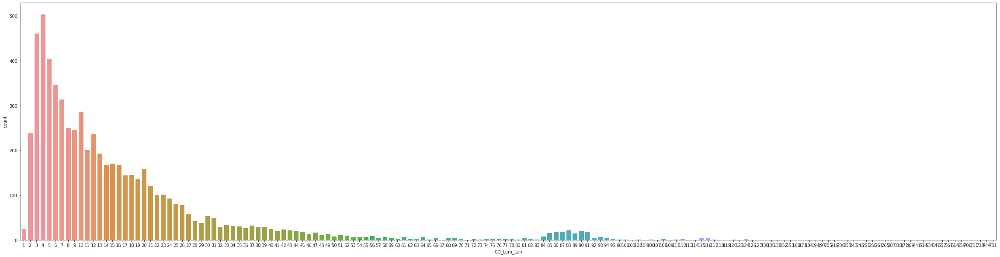

In [ ]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(40, 10)
sns.countplot(df.CD_Lem_Len, ax = ax)
plt.show()

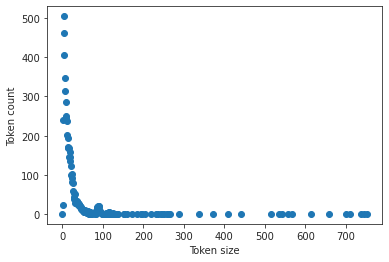

In [ ]:
tokengroup = df.groupby('tokencount')
tokensize = tokengroup.count()

#plot
tokensize = tokensize['CD_Lem_Len']
plt.scatter(tokensize.index, tokensize)
plt.xlabel('Token size')
plt.ylabel('Token count');

In [ ]:
# tokens per sentence
df['tokencount'].describe()

count    6475.000000
mean       19.191042
std        35.886476
min         0.000000
25%         5.000000
50%        11.000000
75%        21.000000
max       751.000000
Name: tokencount, dtype: float64

In [ ]:
print(df.shape)
df.drop(df[df['tokencount']==0].index, inplace = True, axis = 0) 
print(df.shape)

(6475, 16)
(6474, 16)


In [ ]:
# tokens per sentence
df['tokencount'].describe()

count    6474.000000
mean       19.194007
std        35.888455
min         1.000000
25%         5.000000
50%        11.000000
75%        21.000000
max       751.000000
Name: tokencount, dtype: float64

In [ ]:
print('No. of records:', len(df[df['tokencount'] == 1]))
print(df[df['tokencount'] == 1]['CD_Lem'])

No. of records: 24
39             [call]
306         [support]
339         [account]
453         [problem]
597            [chat]
616          [ticket]
621          [ignore]
624             [ing]
1723    [malfunction]
1768          [setup]
2438            [log]
2848              [k]
2933        [install]
3669        [connect]
3699           [lock]
4584         [unlock]
4875          [query]
5016           [node]
5179         [window]
5960          [issue]
6377      [reinstall]
7087        [monitor]
7465             [mm]
8237          [order]
Name: CD_Lem, dtype: object


**OBSERVATION:**

Most rows are under 50 words.  There are > 2500 rows which have under 50 words

23 records with just 1 token would not add value to any analysis ad it is insufficient to understand the context

##### 2.c Using Wordcloud to check for spread of incidents within Groups

In [ ]:
from wordcloud import WordCloud,STOPWORDS
def generate_word_cloud(corpus):
    # Instantiate the wordcloud object
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords=STOPWORDS,
                    random_state = 123,
                    min_font_size = 10).generate(corpus)

    # plot the WordCloud image                        
    plt.figure(figsize = (12, 12), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 

    plt.show()

Wordcloud of top 5 groups - GRP_0,GRP_8,GRP_24,GRP_12,GRP_9

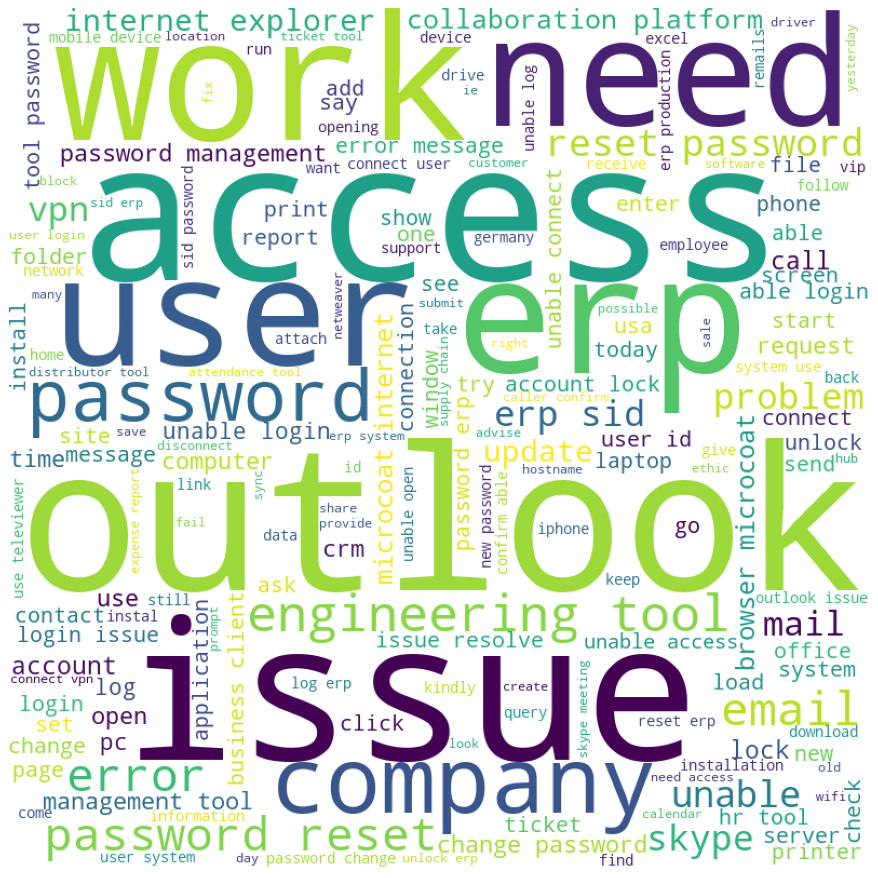

In [ ]:
# Word Cloud for all tickets assigned to GRP_0 - First major grp
generate_word_cloud(' '.join(df[df['Group'] == 'GRP_0'].CD_Lem_token_combined.str.strip()))

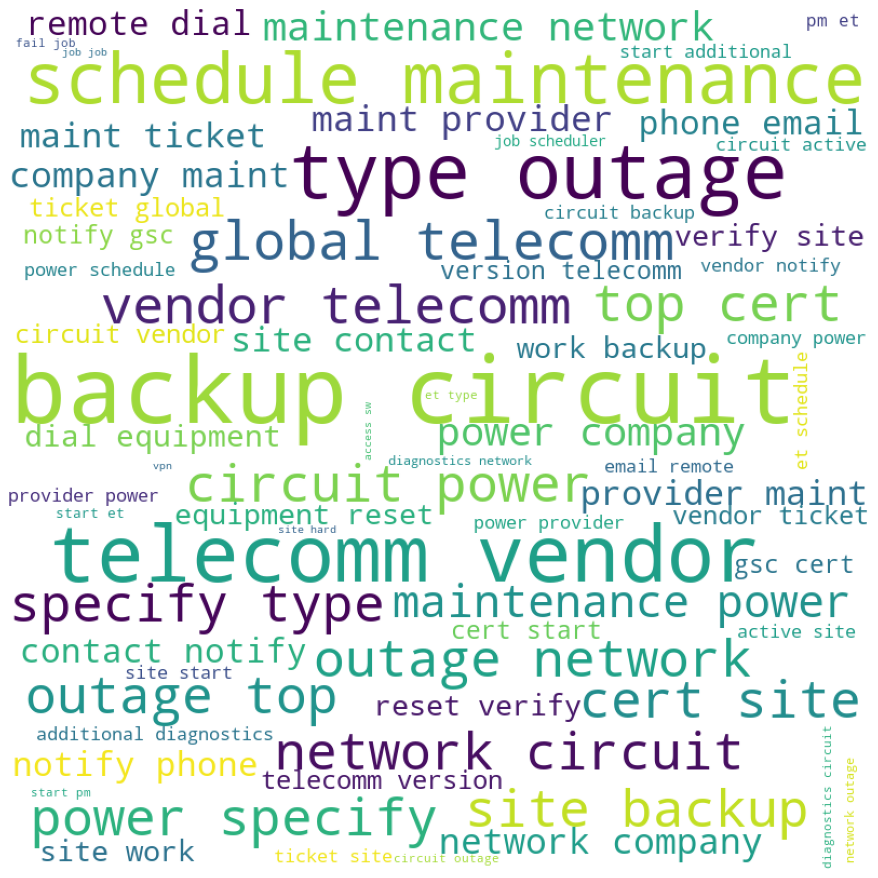

In [ ]:
# Word Cloud for all tickets assigned to GRP_8 - Second major grp
generate_word_cloud(' '.join(df[df['Group'] == 'GRP_8'].CD_Lem_token_combined.str.strip()))

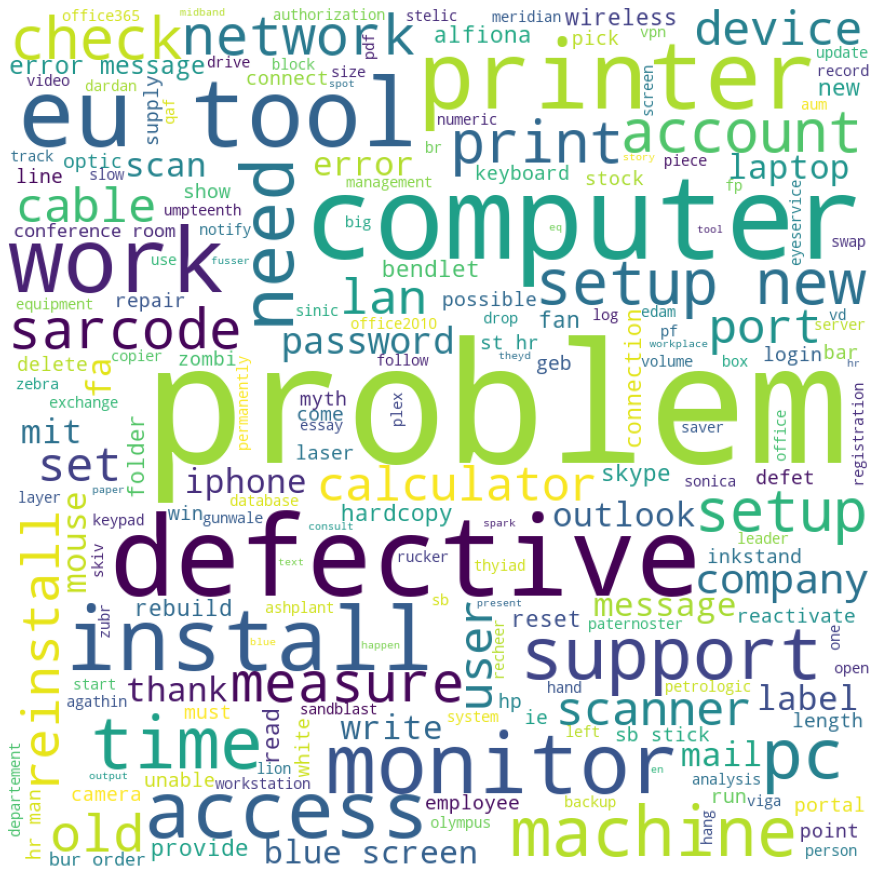

In [ ]:
# Word Cloud for all tickets assigned to GRP_24 - Third major grp
generate_word_cloud(' '.join(df[df['Group'] == 'GRP_24'].CD_Lem_token_combined.str.strip()))

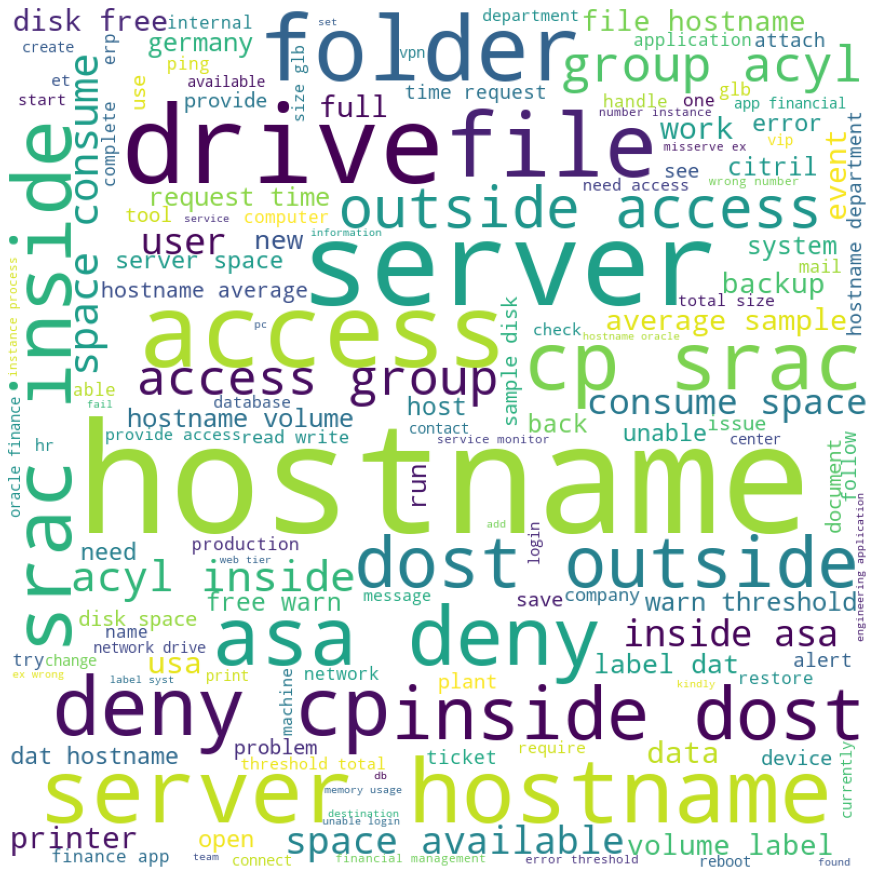

In [ ]:
# Word Cloud for all tickets assigned to GRP_12 
generate_word_cloud(' '.join(df[df['Group'] == 'GRP_12'].CD_Lem_token_combined.str.strip()))

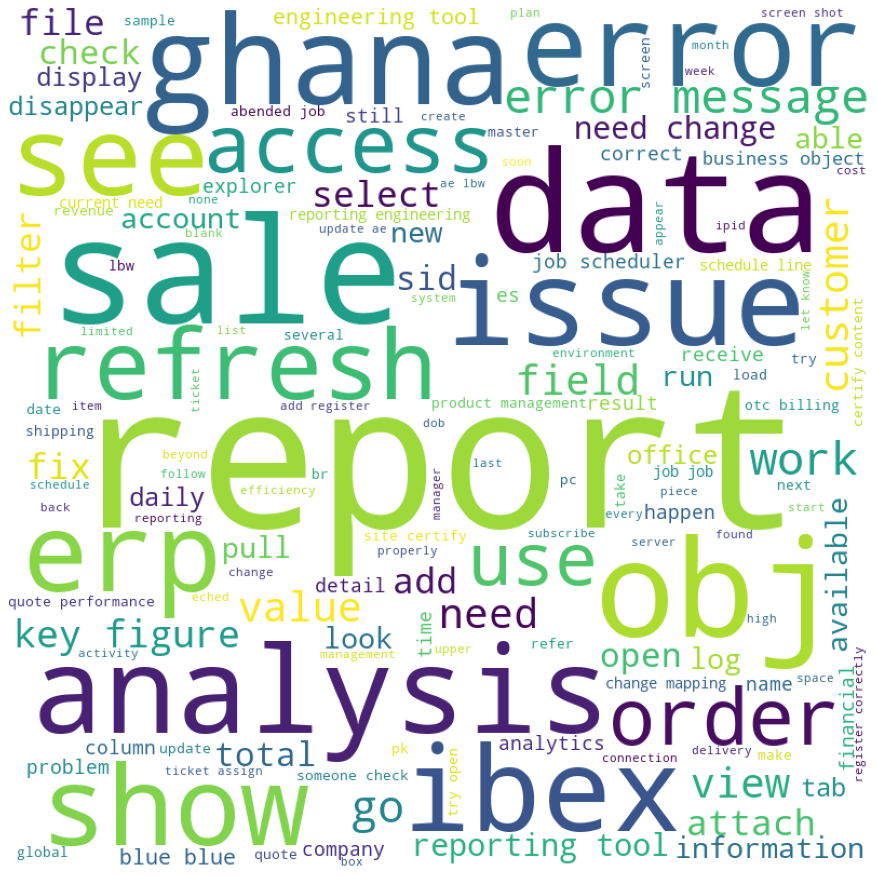

In [ ]:
# Word Cloud for all tickets assigned to GRP_9
generate_word_cloud(' '.join(df[df['Group'] == 'GRP_9'].CD_Lem_token_combined.str.strip()))

**OBSERVATION:** 

1.   GRP_0 - Most tickets related to User,access,outlook issues,password reset, access issues,login issue, connectivity issue related to various tools
2. GRP_8 - More tickets related to outage, job failures, monitoring tool,telecom 
3. GRP_24 - More tickets related to  IT infra setups like - workstation ,Printer ,skype,lan
4. GRP_12 - More tickets related to  network related issues citrix, acls
5. GRP_9 has more tickets related to  reports,analytics,job scheduler

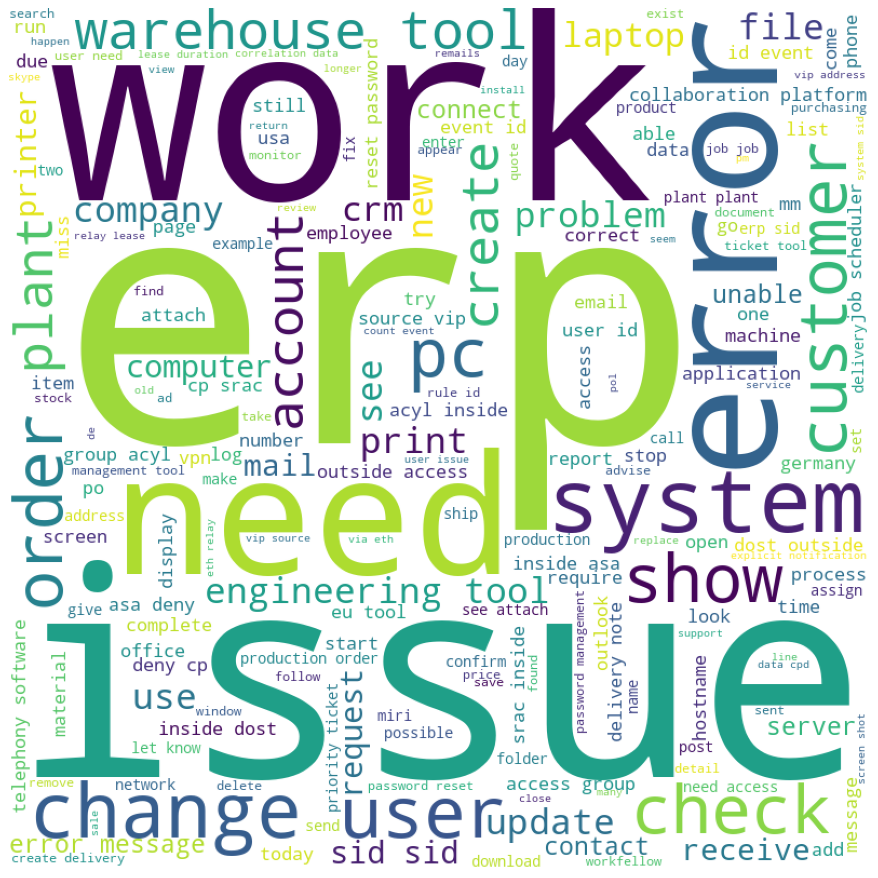

In [ ]:
# Word Cloud for all tickets not assigned to GRPS - Other groups except 'GRP_0','GRP_8','GRP_24','GRP_12','GRP_9'
generate_word_cloud(' '.join(df[~df['Group'].isin(['GRP_0','GRP_8','GRP_24','GRP_12','GRP_9'])].CD_Lem_token_combined.str.strip()))

Below is a distribution of Job Schedhler incidents which are also spread across different groups for similar incident type

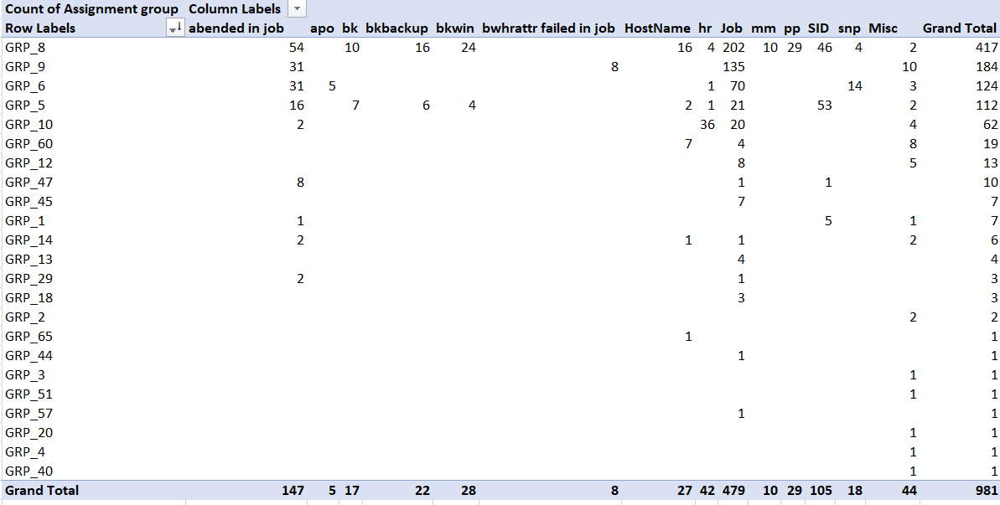

### Using bigrams to identify clusters of words distributed amongst groups

In [ ]:
#to process the simple_process gensim package as input needed as string 
Full_summary=df.CD_Lem_token_combined.values.tolist()

def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True, min_len=2))  # deacc=True removes punctuations. Ignoring records with token count > 2

data_words = list(sent_to_words(Full_summary))

print(data_words[3454])

['subject', 'case', 'transfer', 'tool', 'trial', 'report', 'old', 'laptop', 'new', 'laptop']


In [ ]:
# Creating Bigrams and Trigrams to create the word cloud and evaluate the group 
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=10) 
trigram = gensim.models.Phrases(bigram[data_words], threshold=10)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [ ]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[doc] for doc in texts]

In [ ]:
# Form Bigrams and Trigram words
data_words_bigrams = make_bigrams(data_words)
data_words_trigrams = make_trigrams(data_words_bigrams)

In [ ]:
for i in range(111,1111, 100):
  print("Bigram words", data_words_bigrams[i])

Bigram words ['channel_partner', 'email_address', 'receive_remails', 'regard', 'po', 'error', 'millisecond', 'angry', 'need', 'fix', 'erp', 'attach', 'file', 'extract', 'erp', 'document', 'remails', 'channel_partner', 'receive', 'multiple', 'remails', 'erp']
Bigram words ['browser_microcoat', 'internet_explorer', 'vitry', 'open', 'excel_file', 'microcoat', 'online', 'work', 'vitry', 'open', 'excel_file', 'microcoat', 'online', 'work']
Bigram words ['put', 'new', 'password', 'account', 'yesterday', 'change', 'password', 'work', 'hors', 'since', 'work', 'suspicion', 'new', 'password', 'like', 'past', 'year', 'ago', 'want', 'log_into', 'password_management', 'tool', 'password', 'without', 'success', 'new', 'password', 'work', 'vpn']
Bigram words ['caber', 'security']
Bigram words ['face', 'issue', 'wifi', 'connectivity', 'erp', 'login', 'issue', 'wi_fi', 'erp', 'login']
Bigram words ['labile', 'printer', 'final', 'inspection', 'defense', 'issue', 'no', 'label', 'labile', 'printer', 'work'

### Calculating Vocablary Size

In [ ]:
# create Pre Lemmatization dictionary and get the length of vocabulary:
id2word_prelem = corpora.Dictionary(df.Clean_Description.str.split()) 
print('Total Pre Lemmatization Vocabulary Size:', len(id2word_prelem))

# create Post Lemmatization dictionary and get the length of vocabulary:
id2word_postlem = corpora.Dictionary(data_words) 
print('Total Post Lemmatization Vocabulary Size:', len(id2word_postlem))

# create Post Lemmatization and Bigrams dictionary and get the length of vocabulary:
id2word = corpora.Dictionary(data_words_bigrams) 
print('Total Post Lemmatization and Bigrams Vocabulary Size:', len(id2word))

Total Pre Lemmatization Vocabulary Size: 7028
Total Post Lemmatization Vocabulary Size: 5691
Total Post Lemmatization and Bigrams Vocabulary Size: 6482


**OBSERVATION:** 


1.   Lemmatization has reduced Vocab size by 1354 words by removing redundant words
2.   While creating bigrams has increased the vocab size by ~100 record, we need to evaluate if it will help in identifying connected words that explain incident better than single words

**IMPLICATION**: 
 - Reduction of VOCAB size may help in Topic Modelling algorithms to improve efficiency as well as curse of dimensionality



In [ ]:
print(bigram_mod[data_words[43]])
print(bigram_mod[data_words[44]])

['log_into', 'hr_tool', 'etime', 'through', 'single_sign', 'portal']
['password', 'change', 'password_management', 'tool', 'didnt', 'update', 'erp', 'account']


In [ ]:
#Copying to new dataframe to create wordclouds on target class
new_df = pd.DataFrame(df, columns=['Group', 'CD_Lem_token_combined'])
new_df['words'] = data_words_bigrams
new_df.head()

,Group,CD_Lem_token_combined,words
0,GRP_0,verify user detail employee name checked user ...,"[verify, user, detail_employee, name_checked, ..."
1,GRP_0,meeting skype meeting appear outlook calendar ...,"[meeting, skype_meeting, appear, outlook, cale..."
2,GRP_0,can not log vpn log vpn,"[can_not, log, vpn, log, vpn]"
3,GRP_0,unable access hr tool page,"[unable, access, hr_tool, page]"
4,GRP_0,skype error,"[skype, error]"


In [ ]:
new_df[new_df['CD_Lem_token_combined'].str.contains("login issue")].Group.value_counts()

GRP_0     57
GRP_22     1
GRP_40     1
GRP_23     1
GRP_27     1
GRP_7      1
Name: Group, dtype: int64

In [ ]:
new_df[new_df['CD_Lem_token_combined'].str.contains("reset password")].Group.value_counts()

GRP_0     141
GRP_17     31
GRP_2      16
GRP_7      10
GRP_53      3
GRP_21      1
GRP_12      1
GRP_31      1
GRP_19      1
Name: Group, dtype: int64

In [ ]:
new_df[new_df['CD_Lem_token_combined'].str.contains("password reset")].Group.value_counts()

GRP_0     166
GRP_17     31
GRP_2       5
GRP_7       4
GRP_12      1
Name: Group, dtype: int64

In [ ]:
wordclouds_bigram=' '.join(map(str, data_words_bigrams))
print('Number of bigrams generated:', len(wordclouds_bigram))

Number of bigrams generated: 1119777


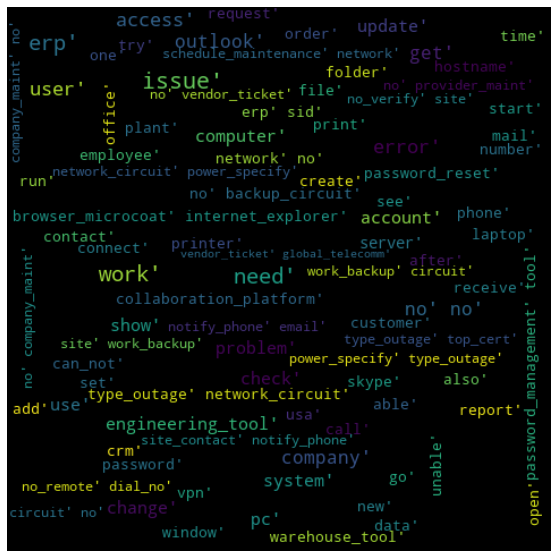

In [ ]:
# Bigram word cloud
wordcloud = WordCloud(width=480, height=480, max_font_size=20, min_font_size=10, ranks_only=True,random_state=123).generate(wordclouds_bigram)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

In [ ]:
wordclouds_trigram=' '.join(map(str, data_words_trigrams))
wordclouds_trigram

"['verify_user', 'detail_employee_name_checked', 'user_name_ad', 'reset_password', 'advise', 'user', 'login_check_caller', 'confirm_able_login', 'issue_resolve', 'login', 'issue'] ['meeting', 'skype_meeting', 'appear', 'outlook', 'calendar', 'somebody', 'advise', 'correct', 'outlook'] ['can_not', 'log', 'vpn', 'log', 'vpn'] ['unable', 'access', 'hr_tool', 'page'] ['skype', 'error'] ['unable', 'log', 'engineering_tool', 'skype'] ['event', 'critical', 'hostname', 'value', 'outpoint', 'threshold', 'oracle', 'sid', 'data', 'event', 'critical', 'hostname', 'value', 'outpoint', 'threshold', 'oracle', 'sid'] ['ticket', 'employment_status', 'new', 'non', 'employee', 'enter', 'user', 'name'] ['unable', 'disable', 'add', 'in', 'outlook'] ['ticket', 'update', 'inplant'] ['engineering_tool', 'say', 'connect', 'unable', 'submit', 'report'] ['hr_tool', 'site', 'load', 'page', 'correctly'] ['unable_login', 'hr_tool', 'card'] ['user', 'want', 'reset_password'] ['unable_open', 'payslip'] ['unable_login

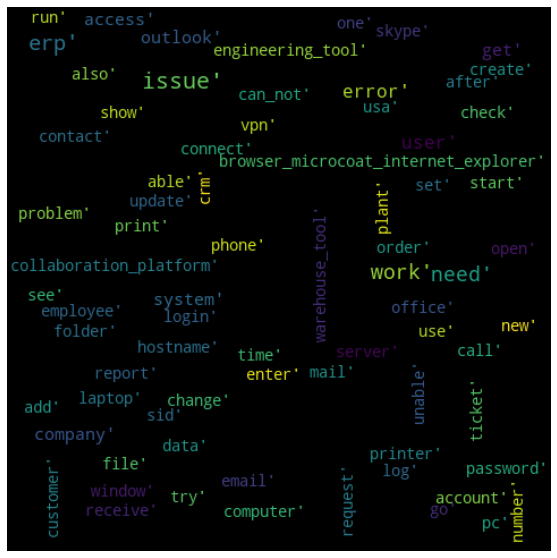

In [ ]:
wordcloud_tri = WordCloud(width=480, height=480, max_font_size=20, min_font_size=10, ranks_only=True,random_state=123).generate(wordclouds_trigram)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud_tri, interpolation="bilinear")
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

## Using Supervised Learning on 'Group' of given problem statement to ascertain accuracy performance 

In [ ]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
import os
from os import system
warnings.filterwarnings('ignore')
import glob

from IPython.display import Image  
import seaborn as sns
from scipy.stats import zscore
from scipy import stats

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# Supervised ML models
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.cluster import KMeans
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import MultinomialNB
import xgboost as xgb
from xgboost.sklearn import XGBClassifier

#Pipeline, Cross valdiation and Parameter tuning
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

#Evaluation metrics
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, f1_score, cohen_kappa_score, log_loss
from sklearn.metrics import auc, accuracy_score, precision_recall_curve, roc_curve

from pprint import pprint

#Used to convert text into vectors
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer

In [ ]:
#Convert the assignment group into new categorical column 
new_df['target_label'] = new_df['Group'].astype('category').cat.codes

In [ ]:
#check the old and the new group
print("original group variable value count: {}, new target label value count: {}".format(len(new_df.Group.value_counts()), len(new_df.target_label.value_counts())))

original group variable value count: 73, new target label value count: 73


In [ ]:
new_df.head()

,Group,CD_Lem_token_combined,words,target_label
0,GRP_0,verify user detail employee name checked user ...,"[verify, user, detail_employee, name_checked, ...",0
1,GRP_0,meeting skype meeting appear outlook calendar ...,"[meeting, skype_meeting, appear, outlook, cale...",0
2,GRP_0,can not log vpn log vpn,"[can_not, log, vpn, log, vpn]",0
3,GRP_0,unable access hr tool page,"[unable, access, hr_tool, page]",0
4,GRP_0,skype error,"[skype, error]",0


In [ ]:
# Create Train and Test data 
def create_train_test_data(input_data, target, split):
  x_train, x_test, y_train, y_test = train_test_split(input_data, 
                                                      target, 
                                                      test_size=split, 
                                                      random_state=13)
  return x_train, x_test, y_train, y_test

x_train, x_test, y_train, y_test = create_train_test_data(new_df.CD_Lem_token_combined,new_df.target_label, 0.2)

In [ ]:
def train_test(model, x_train, x_test, y_train, y_test):
  
  tfidf_vectorizer = TfidfVectorizer()
  x_train = tfidf_vectorizer.fit_transform(x_train)
  x_test = tfidf_vectorizer.transform(x_test)
  print("\nconverted the input data into vector form\n") 
  
  model.fit(x_train, y_train)
  y_pred = model.predict(x_test)
  y_train_pred = model.predict(x_train)

  print('Classifier:', model)
  print('-'*100)
  print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
  print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
  print('-'*100)
  f1 = round(f1_score(y_pred, y_test,average='weighted'), 2)
  print('f1 score: %.2f%%' % (f1* 100))
  print('-'*100)
  cohen_kappa = round(cohen_kappa_score(y_test, y_pred), 2)
  print('cohen_kappa score: %.2f%%' % (cohen_kappa * 100))
  print('-'*100)
  cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=23)
  # evaluate model
  cv_f1 = round(np.mean(cross_val_score(model, x_train, y_train, scoring='f1_weighted', cv=cv, n_jobs=-1)), 2)
  print('cv_f1 score: %.2f%%' %(cv_f1 * 100))
  print('-'*100)
  print('Confusion matrix:\n %s' % (confusion_matrix(y_test, y_pred)))
  print('-'*100)
  print('Classification report:\n %s' % (classification_report(y_test, y_pred)))

In [ ]:
# take the model, and data as inputs and print the accuracy scores

def fit_predict_report(model, x_train, y_train, x_test, y_test):  
        
    model.fit(x_train, y_train)   # fit the model with the training data

    y_pred = model.predict(x_test)  # make predictions on the test set

        # compute accuracy score for test set upto 2 decimals

    train_accuracy = round(model.score(x_train, y_train), 2)
    test_accuracy = round(model.score(x_test, y_test), 2)   
    f1 = round(f1_score(y_pred, y_test,average='weighted'), 2)
    cohen_kappa = round(cohen_kappa_score(y_test, y_pred), 2)

    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=23)
    # evaluate model
    cv_f1 = round(np.mean(cross_val_score(model, x_train, y_train, scoring='f1_weighted', cv=cv, n_jobs=-1)),2)

   
    return train_accuracy, test_accuracy, f1, y_pred, cohen_kappa, cv_f1, model
    

In [ ]:
def supervised_models(x_train, y_train, x_test, y_test):

    print("x_train : {}, y_train : {}, x_test : {}, y_test : {}\n".format(x_train.shape, y_train.shape, x_test.shape, y_test.shape))
            
    sgd = SGDClassifier(loss='modified_huber', penalty='elasticnet', class_weight='balanced', n_jobs=-1, random_state=13)
    sgd_train_accuracy, sgd_test_accuracy, sgd_f1, sgd_pred, sgd_ck, sgd_cv_f1, sgd_model = fit_predict_report(sgd, x_train, y_train, x_test, y_test)
    print("Stochastic Gradient Descent Classifier executed\n")

       
    mnb = MultinomialNB()
    mnb_train_accuracy, mnb_test_accuracy, mnb_f1, mnb_pred, mnb_ck, mnb_cv_f1, mnb_model = fit_predict_report(mnb, x_train, y_train, x_test, y_test )
    print("Multinomial Naive Bayes Classifier executed\n")

    rfc = RandomForestClassifier(n_estimators=100, class_weight='balanced', n_jobs=-1, random_state=13)
    rfc_train_accuracy, rfc_test_accuracy, rfc_f1, rfc_y_pred, rfc_ck, rfc_cv_f1, rfc_model = fit_predict_report(rfc, x_train, y_train, x_test, y_test)
    print("Random Forest Classifier executed\n")

    linearSVC = LinearSVC(class_weight='balanced', random_state=13)
    lsvc_train_accuracy, lsvc_test_accuracy, lsvc_f1, lsvc_y_pred, lsvc_ck, lsvc_cv_f1, lsvc_model = fit_predict_report(linearSVC, x_train, y_train, x_test, y_test)
    print("Linear SVC executed\n")

    rbf_svc = SVC(class_weight='balanced', gamma='scale', random_state=13)
    rbf_svc_train_accuracy, rbf_svc_test_accuracy, rbf_svc_f1, rbf_svc_y_pred, rbf_svc_ck, rbf_svc_cv_f1, rbf_svc_model = fit_predict_report(rbf_svc, x_train, y_train, x_test, y_test)
    print("RBF SVC executed\n")

    knn = KNeighborsClassifier(weights='distance', n_jobs=-1)
    knn_train_accuracy, knn_test_accuracy, knn_f1, knn_y_pred, knn_ck, knn_cv_f1, knn_model = fit_predict_report(knn, x_train, y_train, x_test, y_test)
    print("KNN classifier executed\n")
    
    xgb = XGBClassifier(subsample=0.5, random_state = 13)
    xgb_train_accuracy, xgb_test_accuracy, xgb_f1, xgb_y_pred, xgb_ck, xgb_cv_f1, xgb_model  = fit_predict_report(xgb, x_train, y_train, x_test, y_test)
    print("XGBoost Classifier executed\n")

    print("Training accuracy, Test Accuracy, F1 score, Cohen Kappa score, Cross_Val_F1 score for the model\n")

    result = pd.DataFrame({'Model' : ['SGD_Clf', 'MNB_Clf', 'RFC_Clf', 'linear_SVC', 'RBF_SVC', 'KNN', 'XGB_Clf'],
                          'Train_Acc': [  sgd_train_accuracy , mnb_train_accuracy, rfc_train_accuracy, lsvc_train_accuracy, rbf_svc_train_accuracy, knn_train_accuracy, xgb_train_accuracy ],
                          'Test_Acc': [  sgd_test_accuracy ,  mnb_test_accuracy, rfc_test_accuracy, lsvc_test_accuracy, rbf_svc_test_accuracy, knn_test_accuracy, xgb_test_accuracy ],
                          'F1_Score': [sgd_f1, mnb_f1, rfc_f1, lsvc_f1, rbf_svc_f1, knn_f1, xgb_f1 ],
                          'Cohen_Kappa': [sgd_ck, mnb_ck, rfc_ck, lsvc_ck, rbf_svc_ck, knn_ck, xgb_ck ],
                          'CV_F1': [sgd_cv_f1, mnb_cv_f1,rfc_cv_f1, lsvc_cv_f1,rbf_svc_cv_f1 , knn_cv_f1, xgb_cv_f1 ]})
    
    print(result)

In [ ]:
def print_classification_score(model, x_train, y_train, x_test, y_test):

  #create classification pipeline

  text_clf = Pipeline([('tfidf', TfidfVectorizer()),('clf', model)])
      
  text_clf.fit(x_train, y_train)
  y_pred = text_clf.predict(x_test)
  print("x_test_shape",x_test.shape,"x_train_shape\n",x_train.shape )
  y_train_pred = text_clf.predict(x_train)

  #print the metrics
  print('Cohen kappa score:\n %s' % (cohen_kappa_score(y_test, y_pred)))
  print('-'*100)

  print('Training accuracy: %.3f%%' % (accuracy_score(y_train,y_train_pred) * 100))
  print('-'*100)
  print('Testing accuracy: %.3f%%' % (accuracy_score(y_test, y_pred) * 100))
  print('-'*100)
  print('cohen_kappa score: %0.3f%%' % (cohen_kappa_score(y_test, y_pred)*100))
  print('-'*100)
  cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=23)
    # evaluate model
  cv_f1 = np.mean(cross_val_score(text_clf, x_train, y_train, scoring='f1_weighted', cv=cv, n_jobs=-1))
  print("cross validation f1 weighted score: {}".format(cv_f1))
  print('-'*100)

  print('Confusion matrix:\n %s' % (confusion_matrix(y_test, y_pred)))
  print('-'*100)
  print('Classification report:\n')

  report = classification_report(y_test, y_pred, output_dict=True)
  df_report = pd.DataFrame(report).transpose()

  
  df_report.to_csv('Classification report.csv')
  

  return df_report

In [ ]:
def run_supervised_ml_models(vectorizer, x_train, y_train, x_test, y_test):
  x_train_tfidf = vectorizer.fit_transform(x_train)
  x_test_tfidf = vectorizer.transform(x_test)
  print("\nconverted the input data into vector form\n")

  supervised_models(x_train_tfidf, y_train, x_test_tfidf, y_test)

In [ ]:
%time
tfidf_vectorizer = TfidfVectorizer()
run_supervised_ml_models(tfidf_vectorizer, x_train, y_train, x_test, y_test)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.39 µs

converted the input data into vector form

x_train : (5179, 5261), y_train : (5179,), x_test : (1295, 5261), y_test : (1295,)

Stochastic Gradient Descent Classifier executed

Multinomial Naive Bayes Classifier executed

Random Forest Classifier executed

Linear SVC executed

RBF SVC executed

KNN classifier executed

XGBoost Classifier executed

Training accuracy, Test Accuracy, F1 score, Cohen Kappa score, Cross_Val_F1 score for the model

        Model  Train_Acc  Test_Acc  F1_Score  Cohen_Kappa  CV_F1
0     SGD_Clf       0.89      0.57      0.56         0.47   0.57
1     MNB_Clf       0.52      0.50      0.65         0.13   0.36
2     RFC_Clf       1.00      0.59      0.67         0.35   0.50
3  linear_SVC       0.86      0.53      0.50         0.44   0.56
4     RBF_SVC       0.74      0.48      0.46         0.38   0.50
5         KNN       1.00      0.60      0.66         0.40   0.53
6     XGB_Clf       0.74      0.58

In [ ]:
#Models that can be checked: MultinomialNB(), XGBClassifier(random_state = 13), SVC(random_state = 13)
print_classification_score(SGDClassifier(loss='modified_huber', penalty='elasticnet', class_weight='balanced', n_jobs=-1, random_state=13), x_train, y_train, x_test, y_test)

x_test_shape (1295,) x_train_shape
 (5179,)
Cohen kappa score:
 0.46702796703385707
----------------------------------------------------------------------------------------------------
Training accuracy: 89.342%
----------------------------------------------------------------------------------------------------
Testing accuracy: 56.834%
----------------------------------------------------------------------------------------------------
cohen_kappa score: 46.703%
----------------------------------------------------------------------------------------------------
cross validation f1 weighted score: 0.5681838604983019
----------------------------------------------------------------------------------------------------
Confusion matrix:
 [[407   0   4 ...   3   0   2]
 [  1   0   0 ...   0   0   0]
 [  3   0   6 ...   0   0   0]
 ...
 [  3   0   0 ...   7   0   0]
 [  1   0   0 ...   0  44   1]
 [  3   0   0 ...   0   0   8]]
-----------------------------------------------------------------

,precision,recall,f1-score,support
0,0.814000,0.689831,0.746789,590.00000
1,0.000000,0.000000,0.000000,1.00000
2,0.272727,0.400000,0.324324,15.00000
3,0.250000,0.166667,0.200000,6.00000
4,0.397059,0.540000,0.457627,50.00000
...,...,...,...,...
71,0.830189,0.771930,0.800000,57.00000
72,0.421053,0.470588,0.444444,17.00000
accuracy,0.568340,0.568340,0.568340,0.56834
macro avg,0.345219,0.317591,0.314335,1295.00000


In [ ]:
# Sequential Modeling
import tensorflow
from keras.models import Sequential, Model
from keras.layers.merge import Concatenate
from keras.layers import Input, Dropout, Flatten, Dense, Embedding, LSTM, GRU, Bidirectional
from keras.layers import BatchNormalization, TimeDistributed, Conv1D, MaxPooling1D
from keras.constraints import max_norm, unit_norm
from keras.preprocessing.text import Tokenizer as Keras_Tokenizer
from keras.preprocessing.text import text_to_word_sequence
from keras.preprocessing.sequence import pad_sequences
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import plot_model

# Models

from tensorflow.keras.layers import Dense, LSTM, Embedding, Dropout, Flatten, Bidirectional
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.initializers import Constant
from sklearn import metrics

In [ ]:
print("%percentage of sentence that are <=100 words long : {}".format((len(df[df['tokencount']<=100])/df.shape[0])*100))

#~99% of the sentences are <=100 so keeping the sentence length embedding to 100.
max_sent_length = 100
num_words = len(new_df.CD_Lem_token_combined.values.tolist())
Full_summary=df.CD_Lem_token_combined.values.tolist()
embedding_vector_size = 50

def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True, min_len=1))  # deacc=True removes punctuations. Ignoring records with token count < 2

def convert_input_data_labels(df_x, df_y):
  tokenizer = Keras_Tokenizer(num_words=num_words,lower=True,split=' ', char_level=False)
  tokenizer.fit_on_texts(df_x)
  text2seq = tokenizer.texts_to_sequences(df_x)
  dict_vocab = tokenizer.word_index
  x = pad_sequences(text2seq, maxlen=max_sent_length, padding="post", truncating="post")
  y = np.asarray(df_y)
  print("size of vocab : {}, shape of input_data: {} and label :{}".format(len(dict_vocab), x.shape, y.shape))
  return x, y, dict_vocab

def create_embedding_matrix(dict_vocab, embeddings, model):
  word_not_found = []
  for word, idx in dict_vocab.items():  
    try: 
      embeddings[idx] = model[word]
    except:
      word_not_found.append(word)
      print("words not found in embedding_model : {}".format(word_not_found))
  return  embeddings
  

def get_word_embedding(embed_model, sentences, vect_size, dict_vocab,):
  # create the embedding matrix of size = length of vocabulary x vector size, and initialize it with all 0s
  embeddings = np.zeros((len(dict_vocab)+1, vect_size))
  #embeddings = np.zeros((num_words, 50))

  if (embed_model == "word2vec"):
    word2vec_model = gensim.models.word2vec.Word2Vec(sentences=data_words, size=vect_size,   
            window=5, min_count=1, sg=0, iter=30)
    ## update the row with vector
    print('-'*100)
    print("generating word2vec embeddings")
    print('-'*100)
    embeddings = create_embedding_matrix(dict_vocab, embeddings, word2vec_model)
  elif (embed_model == "fasttext"):
    fasttext_model = gensim.models.fasttext.FastText(sentences=data_words, size=vect_size,   
            window=5, min_count=1, sg=0, iter=30)
    print('-'*100)
    print("generating fasttext embeddings")
    print('-'*100)
    embeddings = create_embedding_matrix(dict_vocab, embeddings, fasttext_model)

  print("Number of unique words in embedding: {}, shape of each embedding: {}".format(embeddings.shape[0], embeddings.shape[1]))
  return embeddings

%percentage of sentence that are <=100 words long : 98.79518072289156


In [ ]:
data_words = list(sent_to_words(Full_summary))
x, y, dict_vocab = convert_input_data_labels(new_df.CD_Lem_token_combined, new_df.target_label)
print(dict_vocab.items())
embedding_matrix = np.zeros((len(dict_vocab)+1, embedding_vector_size))
embeddings_w2v = get_word_embedding(embed_model="word2vec", sentences=data_words, vect_size= embedding_vector_size, dict_vocab=dict_vocab)
embeddings_fasttext = get_word_embedding(embed_model="fasttext", sentences=data_words, vect_size= embedding_vector_size, dict_vocab=dict_vocab)
embeddings = np.zeros((len(dict_vocab)+1, embedding_vector_size))

size of vocab : 5717, shape of input_data: (6474, 100) and label :(6474,)
dict_items([('no', 1), ('erp', 2), ('password', 3), ('user', 4), ('tool', 5), ('access', 6), ('issue', 7), ('work', 8), ('company', 9), ('error', 10), ('need', 11), ('unable', 12), ('ticket', 13), ('sid', 14), ('site', 15), ('reset', 16), ('system', 17), ('get', 18), ('circuit', 19), ('power', 20), ('network', 21), ('account', 22), ('outlook', 23), ('hostname', 24), ('id', 25), ('message', 26), ('vendor', 27), ('email', 28), ('use', 29), ('login', 30), ('change', 31), ('problem', 32), ('backup', 33), ('see', 34), ('printer', 35), ('telecomm', 36), ('server', 37), ('phone', 38), ('event', 39), ('log', 40), ('start', 41), ('outage', 42), ('order', 43), ('job', 44), ('time', 45), ('connect', 46), ('new', 47), ('vpn', 48), ('type', 49), ('engineering', 50), ('crm', 51), ('able', 52), ('open', 53), ('mail', 54), ('usa', 55), ('contact', 56), ('pc', 57), ('call', 58), ('update', 59), ('et', 60), ('plant', 61), ('file',

In [ ]:
def LSTM_Model(input_dim, output_dim, max_sent_length, out_length, weights):
    #input_text = Input(shape=(max_sent_length), dtype=tensorflow.int64)
    input_text = Input(shape=(max_sent_length), )

    embedding = Embedding(input_dim=input_dim, output_dim=output_dim, input_length=max_sent_length, weights=[weights], trainable=False)(input_text)
    
    unidirectional_lstm = LSTM(units=256)(embedding)
    
    dropout = Dropout(0.2)(unidirectional_lstm)
  
    activation_layer = Dense(128, activation='relu')(dropout)

    out = Dense(out_length, activation='softmax')(activation_layer)

    model = Model(input_text, out)
    model.compile(loss='sparse_categorical_crossentropy',optimizer='Adagrad', metrics=['accuracy'])
    #print("LSTM " + weights + "summary\n")
    model.summary()
    return model

In [ ]:
  def Bidirect_LSTM_Model(input_dim, output_dim, max_sent_length, out_length, weights):
    #input_text = Input(shape=(max_sent_length), dtype=tensorflow.int64)
    input_text = Input(shape=(max_sent_length), )

    embedding = Embedding(input_dim=input_dim, output_dim=output_dim, input_length=max_sent_length, weights=[weights], trainable=False)(input_text)
    
    bidirectional_lstm = Bidirectional(LSTM(units=256))(embedding)
    
    dropout = Dropout(0.2)(bidirectional_lstm)
  
    activation_layer = Dense(128, activation='relu')(dropout)

    out = Dense(out_length, activation='softmax')(activation_layer)

    model = Model(input_text, out)
    model.compile(loss='sparse_categorical_crossentropy',optimizer='sgd', metrics=['accuracy'])
    #print("Bi directional LSTM " + weights + " summary\n")
    model.summary()
    return model

In [ ]:
def Bidirect_GRU_Model(input_dim, output_dim, max_sent_length, out_length, weights):
  
  input_text = Input(shape=(max_sent_length), )
  
  embedding = Embedding(input_dim=input_dim, output_dim=output_dim, input_length=max_sent_length, weights=[weights], trainable=False)(input_text)
    
  bidirectional_gru = Bidirectional(GRU(units=256))(embedding)
    
  dropout = Dropout(0.2)(bidirectional_gru)
    
  activation_layer = Dense(128, activation='relu')(dropout)
  
  out = Dense(out_length, activation='softmax')(activation_layer)
  
  model = Model(input_text, out)
  model.compile(loss='sparse_categorical_crossentropy',optimizer='Adagrad', metrics=['accuracy'])
  #print("Bi directional GRU " + weights + "summary\n")

  model.summary()
  return model

In [ ]:
def run_model_prediction(model, x_test, y_test):
  y_pred = model.predict(x_test)
  y_pred = [i.argmax() for i in y_pred]
  accuracy = metrics.accuracy_score(y_test, y_pred)
  #loss = metrics.log_loss(y_test, y_pred)
  print("Accuracy is: {}".format(accuracy))
  return accuracy

In [ ]:
# create train and test data sets
x_train, x_test, y_train, y_test = create_train_test_data(x, y, 0.2)
print("shape of x_train: {}, x_test: {}, y_train: {}, y_test: {}".format(x_train.shape, x_test.shape, y_train.shape, y_test.shape))

shape of x_train: (5179, 100), x_test: (1295, 100), y_train: (5179,), y_test: (1295,)


In [ ]:
out_length = len((pd.Series(new_df.target_label)).unique())
lstm_model_w2v = LSTM_Model(input_dim=embeddings.shape[0],output_dim=embeddings.shape[1],
                        max_sent_length=max_sent_length,out_length=out_length,weights=embeddings_w2v)
lstm_model_fasttext = LSTM_Model(input_dim=embeddings.shape[0],output_dim=embeddings.shape[1],
                        max_sent_length=max_sent_length,out_length=out_length,weights=embeddings_w2v)

Model: "functional_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
embedding_17 (Embedding)     (None, 100, 50)           285900    
_________________________________________________________________
lstm_13 (LSTM)               (None, 256)               314368    
_________________________________________________________________
dropout_17 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_34 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_35 (Dense)             (None, 73)                9417      
Total params: 642,581
Trainable params: 356,681
Non-trainable params: 285,900
_________________________________________

In [ ]:
bi_lstm_model_w2v = Bidirect_LSTM_Model(input_dim=embeddings.shape[0],output_dim=embeddings.shape[1],
                        max_sent_length=max_sent_length,out_length=out_length,weights=embeddings_w2v)
bi_lstm_model_fasttext = Bidirect_LSTM_Model(input_dim=embeddings.shape[0],output_dim=embeddings.shape[1],
                        max_sent_length=max_sent_length,out_length=out_length,weights=embeddings_fasttext)

Model: "functional_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_20 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
embedding_19 (Embedding)     (None, 100, 50)           285900    
_________________________________________________________________
bidirectional_10 (Bidirectio (None, 512)               628736    
_________________________________________________________________
dropout_19 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_38 (Dense)             (None, 128)               65664     
_________________________________________________________________
dense_39 (Dense)             (None, 73)                9417      
Total params: 989,717
Trainable params: 703,817
Non-trainable params: 285,900
_________________________________________

In [ ]:
#create GRU model using word2vec and fasttext word embeddings
gru_model_w2v = Bidirect_GRU_Model(input_dim=embeddings.shape[0],output_dim=embeddings.shape[1],
                        max_sent_length=max_sent_length,out_length=out_length,weights=embeddings_w2v)
gru_model_fasttext = Bidirect_GRU_Model(input_dim=embeddings.shape[0],output_dim=embeddings.shape[1],
                        max_sent_length=max_sent_length,out_length=out_length,weights=embeddings_fasttext)

Model: "functional_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
embedding_16 (Embedding)     (None, 100, 50)           285900    
_________________________________________________________________
bidirectional_10 (Bidirectio (None, 512)               473088    
_________________________________________________________________
dropout_16 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_32 (Dense)             (None, 128)               65664     
_________________________________________________________________
dense_33 (Dense)             (None, 73)                9417      
Total params: 834,069
Trainable params: 548,169
Non-trainable params: 285,900
_________________________________________

In [ ]:
def plot_train_accuracy_loss(train_model, model_name):
  plt.plot(train_model.history['accuracy'])
  plt.plot(train_model.history['val_accuracy'])

  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.title(model_name +' model accuracy')
  plt.legend(['train','test'], loc='upper left')
  plt.show()

  plt.plot(train_model.history['loss'])
  plt.plot(train_model.history['val_loss'])

  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.title(model_name +' model loss')

  plt.legend(['train','test'], loc='upper left')
  plt.show()

In [ ]:
num_of_epoch = 10
lstm_model_w2v_train = lstm_model_w2v.fit(x_train, y_train, batch_size=100, epochs=num_of_epoch, verbose=0, validation_split=0.2)
lstm_model_fasttext_train = lstm_model_fasttext.fit(x_train, y_train, batch_size=100, epochs=num_of_epoch, verbose=0, validation_split=0.2)

In [ ]:
bi_lstm_model_w2v_train = bi_lstm_model_w2v.fit(x_train, y_train, batch_size=100, epochs=num_of_epoch, verbose=0, validation_split=0.2)
bi_lstm_model_fasttext_train = bi_lstm_model_fasttext.fit(x_train, y_train, batch_size=100, epochs=num_of_epoch, verbose=0, validation_split=0.2)

In [ ]:
gru_model_w2v_train = gru_model_w2v.fit(x_train, y_train, batch_size=100, epochs=num_of_epoch, verbose=0, validation_split=0.2)
gru_model_fastext_train = gru_model_fasttext.fit(x_train, y_train, batch_size=100, epochs=num_of_epoch, verbose=0, validation_split=0.2)

predicting accuracy of unidirectional LSTM model with word2vec
Accuracy is: 0.4548262548262548


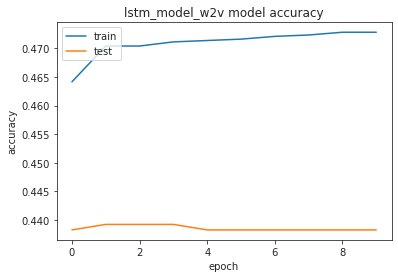

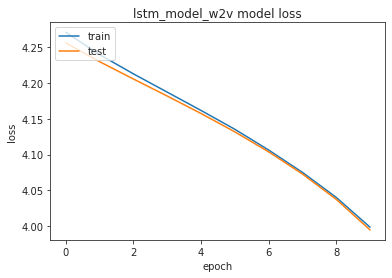

predicting accuracy of unidirectional LSTM model with fasttext
Accuracy is: 0.4555984555984556


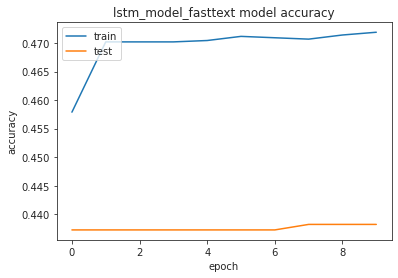

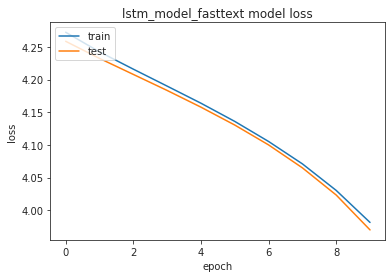

In [ ]:
print("predicting accuracy of unidirectional LSTM model with word2vec")
lstm_w2v_accuracy = run_model_prediction(lstm_model_w2v, x_test, y_test)
plot_train_accuracy_loss(lstm_model_w2v_train, 'lstm_model_w2v')

print("predicting accuracy of unidirectional LSTM model with fasttext")
lstm_fasttext_accuracy = run_model_prediction(lstm_model_fasttext, x_test, y_test)
plot_train_accuracy_loss(lstm_model_fasttext_train, 'lstm_model_fasttext')

predicting accuracy of bidirectional LSTM model with word2vec
Accuracy is: 0.4749034749034749


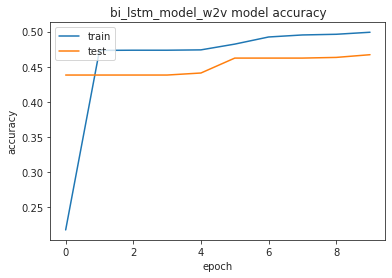

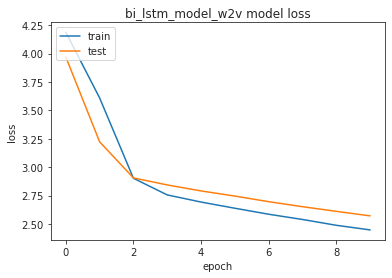

predicting accuracy of bidirectional LSTM model with fasttext
Accuracy is: 0.4965250965250965


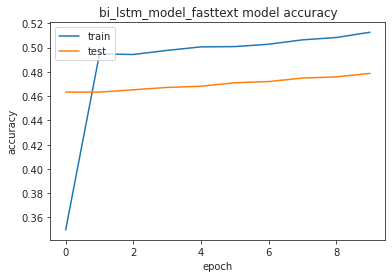

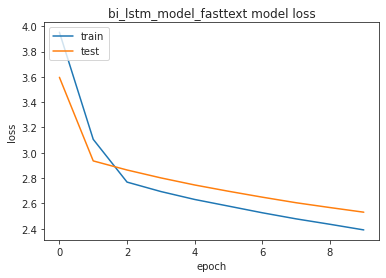

In [ ]:
print("predicting accuracy of bidirectional LSTM model with word2vec")
bi_lstm_w2v_accuracy = run_model_prediction(bi_lstm_model_w2v, x_test, y_test)
plot_train_accuracy_loss(bi_lstm_model_w2v_train, 'bi_lstm_model_w2v')

print("predicting accuracy of bidirectional LSTM model with fasttext")
bi_lstm_fasttext_accuracy = run_model_prediction(bi_lstm_model_fasttext, x_test, y_test)
plot_train_accuracy_loss(bi_lstm_model_fasttext_train, 'bi_lstm_model_fasttext')

predicting accuracy of bidirectional GRU model with word2vec
Accuracy is: 0.47876447876447875


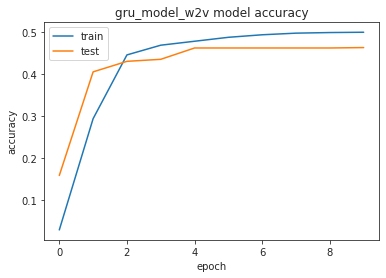

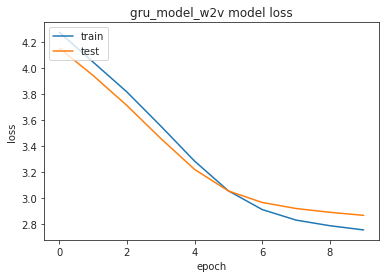

predicting accuracy of bidirectional GRU model with fasttext
Accuracy is: 0.48185328185328186


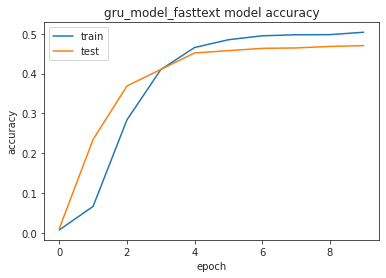

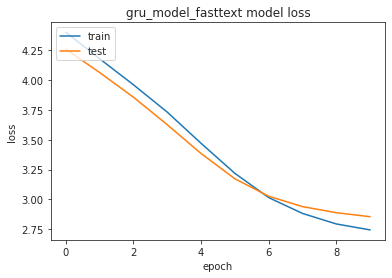

In [ ]:
print("predicting accuracy of bidirectional GRU model with word2vec")
gru_w2v_accuracy = run_model_prediction(gru_model_w2v, x_test, y_test)
plot_train_accuracy_loss(gru_model_w2v_train, 'gru_model_w2v')

print("predicting accuracy of bidirectional GRU model with fasttext")
gru_fasttext_accuracy = run_model_prediction(gru_model_fasttext, x_test, y_test)
plot_train_accuracy_loss(gru_model_fastext_train, 'gru_model_fasttext')

**OBSERVATIONS:**

1. From the above word cloud visualization and text analysis, bigram seems to be providing more meaning full words/terms. We will evaluate both unigrams and bigrams to decide which one will be used to create final corpus.

2.  Based on Wordclouds, there is a large overlap of incidents  appearing accross mutiple groups, For example reset password, erp, jobscheduler even in other groups apart from top 5 groups

3. Analysis of a single Incident type ' Job scheduler' also reveals random spread across multiple groups

**IMPLICATIONS** - Using Bigrams seem to have provide more meaningful words in vocab by pairing words that appear together. Along with unigram this will be used to evaluate the model performance. 

#### 3. Evaluate hypothesis based on above findings and determine next steps

**HYPOTHESIS:** 

*   Each group has distinct type of incidents. There is minimal/no overlap of incidents across groups
*   Incident distribution across groups (aka classes) should not have significant imbalance

**EVALUATION:** Based on significant class imbalance and Inferences drawn from WordCloud and Incidents spread across groups, above Hypothesis is not valid. 


---


**DETERMINING NEXT STEPS:**
To proceed with classification, there are 2 scenarios emerging:
	
**Scenario 1** 
 - Ignore current group structure of 74 groups and reclassify (Topic modelling) tickets based on common incident types across all groups.
 - Observe new group structure with redued number of groups, with good distribution of tickets across groups and reduced overlap of incident type.
	
Pros
 - New group structure will have less imbalance of the incidents across groups. Lower class imbalance improves clasification accuracy.
 - Reduced overlap of incidents across groups.
 - Tangible Business Benefit: Based on resource pool, appropriate groups with lower incident resolution SLAs can be further seggregated into L1/L2 team. Those with higher SLAs for incident resolution can be directly marked to L3 teams.

Cons
 - Overrides existing group structure which may be based on current organizational factors not known to us.
 - May need skill specific resource pool to handle unique incident type across classes - This may increase resource pool size.
	
	
**Scenario 2**
 - Inspect for most common issues across each Group that are less frequent in other groups
 - Based on domain expertise, merge Groups that have similar incident types to reduce clas imbalance until we reach 'X' number of groups with similar volume distribution
 - If there are groups that continue to have lesser than 50 tickets, merge them into a single group 
  - New group structure will have redued class count (X classes), however each class will have a combination of incident types that may be uniformly distributed
	
Pros
 - May reduce class imbalance due to merging of groups
 - May reduce resource pool requirement as number of Groups will be lower than scenario 1 since multiple incident types will be clubbed in one group
	
Cons	
 - Retains existing group structure which is observed to be inaccurate with multiple incidents interspersed across groups.
 - Since each class will have a combination of incidents, Resources mapped to these classes will need to be multi skilled to handle varied incident/language type
 - Since groups are getting merged based on volume and incident type, there is a high likelihood of similar incident types being distributed across several groups leading to inefficiency
 - if there is a new incident type not trained for previously, it may be ignored as it does not fit any of the common issues/volume criteria



---
**ASSESSMENT**
 - Pros outweigh the cons in Scenario 1 and use Topic Modelling approach to reclassify  incidents into appropriate groups




### TOPIC MODELLING

**What is Topic Modelling?**

Topic modeling is a unsupervised machine learning technique that automatically analyzes text data to determine cluster words for a set of documents. It refers to the process of dividing a corpus of documents in two:

1.   A list of the topics covered by the documents in the corpus
2.   Several sets of documents from the corpus grouped by the topics they cover

Underlying assumption is that every document comprises a statistical mixture of topics, i.e. a statistical distribution of topics that can be obtained by “adding up” all of the distributions for all the topics covered. What topic modeling methods do is try to figure out which topics are present in the documents of the corpus and how strong that presence is.

**Types of Topic Modelling?**

Popular topic modeling algorithms include below among which LDA has shown great results in practice and therefore widely adopted. 

*    **K Means clustering** - k-means clustering is a method of vector quantization, originally from signal processing, that aims to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean (cluster centers or cluster centroid), serving as a prototype of the cluster.

*    **Latent Semantic Analysis(LSA)** a.k.a Latent Semantic Indexing - LSI examines the words used in a document and looks for their relationships with other words. LSI allows a system to determine the kind of words that a document might be relevant for, even if they are not actually used on the document itself.  But having content that is full of words that have relationships with each other, you are strengthening the document for all of those words.

*   **Latent Dirichlet Allocation (LDA)** - LDA is a significant extension of LSI.  Words are grouped into topics.  They can exist in more than one topic, in fact most do.  LDA tackles ambiguity by comparing a document to two topics and determining which topic is closer to the document, across all combinations of topics which seem broadly relevant. In doing so, LDA helps to determine which documents are most relevant to which topics

*   **Hierarchical Dirichlet Process (HDP)** - HDP is an extension of LDA, designed to address the case where the number of mixture components (the number of "topics" in document-modeling terms) is not known apriori. For HDP (applied to document modeling), one also uses a Dirichlet process to capture the uncertainty in the number of topics. So a common base distribution is selected which represents the countably-infinite set of possible topics for the corpus, and then the finite distribution of topics for each document is sampled from this base distribution. 

*   **Non-negative Matrix factorization** 
Non-Negative Matrix Factorization (NMF) is an unsupervised technique so there are no labeling of topics that the model will be trained on. The way it works is that, NMF decomposes (or factorizes) high-dimensional vectors into a lower-dimensional representation. These lower-dimensional vectors are non-negative which also means their coefficients are non-negative.
Using the original matrix (A), NMF will give you two matrices (W and H). W is the topics it found and H is the coefficients (weights) for those topics. In other words, A is articles by words (original), H is articles by topics and W is topics by words.


**IMPLICATION OF CHOSING A TOPIC MODELLING TECHNIQUE:**
 
 - Some of the unsupervised models like Kmeans clustering and LSA were tried, however based on research articles, other advanced techniques (LDA and NMF) were found to be more suited for Topic Modelling and extensively used

To chose between LDA, HDP and NMF:
 - Factors such as length of document (sentence), Mix of topics within the document,  usage of Word embedding, model performance will need to be evaluated during our experimentation with these models in below sections

General Steps to conduct LDA - Topic Modelling include
- Cleaning and Preprocessing
- Feature Creation using TF-IDF or BOW
- Selection of topics
- Find the best number of topics to use for the model automatically  using COHERENCE score
- Find the highest quality topics among all the topics
- Predict the topic of unseen document

In [ ]:
!pip install -q pyLDAvis
#pyLDAvis is designed to help users visualize the distribution of topics from a topic model that has been fit to a corpus of text data.

     |████████████████████████████████| 1.6MB 11.5MB/s 


In [ ]:
# Gensim and models
import gensim
from gensim import corpora, models
from gensim.utils import simple_preprocess
from gensim.models.ldamodel import LdaModel
from gensim.models import CoherenceModel, HdpModel
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.nmf import Nmf


# Plotting tools
import pyLDAvis
from pprint import pprint
import pyLDAvis.gensim
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)
from itertools import chain

1. LDA Model - using BoW for feature extraction 

## Install Java

In [ ]:
import os       #importing os to set environment variable
def install_java():
  !apt-get install -y openjdk-8-jdk-headless -qq > /dev/null      #install openjdk
  os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"     #set environment variable
  !java -version       #check java version
install_java()

openjdk version "11.0.9.1" 2020-11-04
OpenJDK Runtime Environment (build 11.0.9.1+1-Ubuntu-0ubuntu1.18.04)
OpenJDK 64-Bit Server VM (build 11.0.9.1+1-Ubuntu-0ubuntu1.18.04, mixed mode, sharing)


## Install Mallet

In [ ]:
!wget http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
!unzip mallet-2.0.8.zip

--2020-12-13 10:26:06--  http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
Resolving mallet.cs.umass.edu (mallet.cs.umass.edu)... 128.119.246.70
Connecting to mallet.cs.umass.edu (mallet.cs.umass.edu)|128.119.246.70|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16184794 (15M) [application/zip]
Saving to: ‘mallet-2.0.8.zip’

mallet-2.0.8.zip    100%[===================>]  15.43M  10.6MB/s    in 1.5s    

2020-12-13 10:26:07 (10.6 MB/s) - ‘mallet-2.0.8.zip’ saved [16184794/16184794]

Archive:  mallet-2.0.8.zip
   creating: mallet-2.0.8/
   creating: mallet-2.0.8/bin/
  inflating: mallet-2.0.8/bin/classifier2info  
  inflating: mallet-2.0.8/bin/csv2classify  
  inflating: mallet-2.0.8/bin/csv2vectors  
  inflating: mallet-2.0.8/bin/mallet  
  inflating: mallet-2.0.8/bin/mallet.bat  
  inflating: mallet-2.0.8/bin/mallethon  
  inflating: mallet-2.0.8/bin/prepend-license.sh  
  inflating: mallet-2.0.8/bin/svmlight2vectors  
  inflating: mallet-2.0.8/bin/text2classi

## Set the path to the Mallet binary and set the path to the corpus

In [ ]:
os.environ['MALLET_HOME'] = '/content/mallet-2.0.8'
mallet_path = '/content/mallet-2.0.8/bin/mallet' # you should NOT need to change this 

### Creating CORPUS and TERM DOCUMENT MATRIX

In [ ]:
#function to create dictionary and corpus using Bag Of Words

def create_dict_corpus_bow(data_words):
# Create Dictionary 
  id2word = corpora.Dictionary(data_words)

# Create Corpus from post clean data 
  texts = data_words
# Term Document Frequency and Bag of words 
  corpus = [id2word.doc2bow(text) for text in texts]
  
  return id2word, texts, corpus

In [ ]:
#function to create dictionary and corpus using tfidf

def create_dict_corpus_tfidf(data_words):

  id2word, texts, corpus = create_dict_corpus_bow(data_words)
  
  tfidf = models.TfidfModel(corpus)
  corpus_tfidf = tfidf[corpus]

  return id2word, texts, corpus_tfidf

In [ ]:
# Create dictionary and corpus using single words and BoWs
id2word, texts, corpus = create_dict_corpus_bow(data_words)

# Create dictionary and corpus using bigram and BoWs
id2word_bigram, texts_bigram, corpus_bigram = create_dict_corpus_bow(data_words_bigrams)

# Create dictionary and corpus using single words and tfidf
id2word, texts, corpus_tfidf = create_dict_corpus_tfidf(data_words)

# Create dictionary and corpus using bigram and tfidf
id2word_bigram, texts_bigram, corpus_bigram_tfidf = create_dict_corpus_tfidf(data_words_bigrams)

In [ ]:
def plot_word_freq(id2word, corpus):
  dict_corpus = {}

  for i in range(len(corpus)):
  #for i in range(0, 11):
    for idx, freq in corpus[i]:
      if id2word[idx] in dict_corpus:
        dict_corpus[id2word[idx]] += freq
        #print("value of i",dict_corpus[id2word[idx]],"and value of id2word[idx]", id2word[idx])
      else:
        dict_corpus[id2word[idx]] = freq
       
  dict_df = pd.DataFrame.from_dict(dict_corpus, orient='index', columns=['freq'])

  plt.figure(figsize=(8,6))
  sns.histplot(dict_df['freq'], bins=50);
  plt.show()
  return dict_df

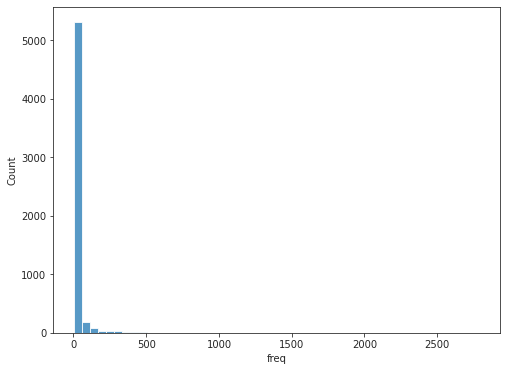

In [ ]:
dict_df = plot_word_freq(id2word=id2word, corpus=corpus)

In [ ]:
dict_df['freq'].sort_values(ascending=False).head(10)

no          2790
erp         1571
password    1472
user        1360
tool        1311
access      1308
issue       1231
work        1105
company     1088
error        986
Name: freq, dtype: int64

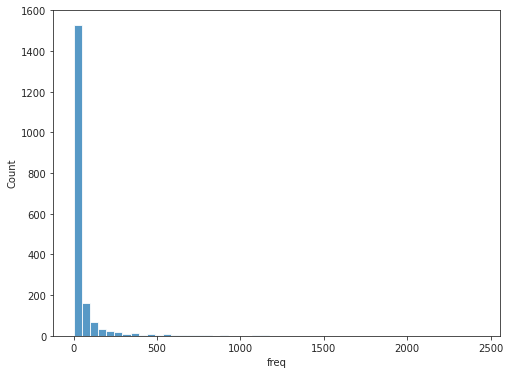

In [ ]:
dict_df_bigram = plot_word_freq(id2word=wordclouds_bigram.split(), corpus=corpus_bigram)

In [ ]:
dict_df_bigram['freq'].sort_values(ascending=False).head(10)

'hr_tool',         2434
'user',            2120
'closing',         1876
'no',              1502
'log',             1345
'check_caller',    1191
'advise',          1158
'use',             1124
'sid',             1119
'need',            1098
Name: freq, dtype: int64

**Implementing top modelling with different models**

For comparison of different topic models Coherence score will be used
- Coherence score paper - http://svn.aksw.org/papers/2015/WSDM_Topic_Evaluation/

## Bayesian LDA (Unigrams with BoW)

In [ ]:
num_topics = 10
model_Lda = LdaMulticore(corpus=corpus,
                            id2word=id2word,
                            num_topics=num_topics,
                            workers=4,
                            random_state=123,
                            iterations=1000,
                            per_word_topics=True)

coherencemodel_cv_Lda = CoherenceModel(model=model_Lda, texts=texts, dictionary=id2word, coherence='c_v')
print("Num Topics =", num_topics, " LDA model has Coherence Value of", round(coherencemodel_cv_Lda.get_coherence(), 2))

Num Topics = 10  LDA model has Coherence Value of 0.44


## LDA Mallet (Unigrams with BoW)

In [ ]:
num_topics = 10
model_LdaM = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus, 
                                                 num_topics=num_topics, 
                                                 id2word=id2word, 
                                                 random_seed=123,
                                                 iterations=1000,
                                                 )

coherencemodel_cv_LdaM = CoherenceModel(model=model_LdaM, texts=texts, dictionary=id2word, coherence='c_v')
print("Num Topics =", num_topics, " LDA Mallet has Coherence Value of", round(coherencemodel_cv_LdaM.get_coherence(), 2))

Num Topics = 10  LDA Mallet has Coherence Value of 0.5


## Word Cloud

In [ ]:
def topic_top_key_words(model, num_topics, topn=10):
  # selecting Top 10 keywords
  topics = [[(term, round(wt, 3)) for term, wt in model.show_topic(n, topn)] for n in range(0, num_topics)]

  # set column width
  pd.set_option('display.max_colwidth', None)
  topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], columns = ['Terms per Topic'], 
                           index=['Topic'+str(t) for t in range(1, num_topics+1)] )
  return topics_df
  
# import wordclouds
from wordcloud import WordCloud
def create_word_cloud(model, num_topics, topn=10):

  topics_df = topic_top_key_words(model,num_topics, topn)
  
  # initiate wordcloud object
  wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=123)

  # set the figure size
  plt.rcParams['figure.figsize'] = [20, 15]

  # Create subplots for each topic
  for i in range(num_topics):
    wc.generate(text=topics_df["Terms per Topic"][i])
    
    plt.subplot(5, 4, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(topics_df.index[i])

  plt.show()

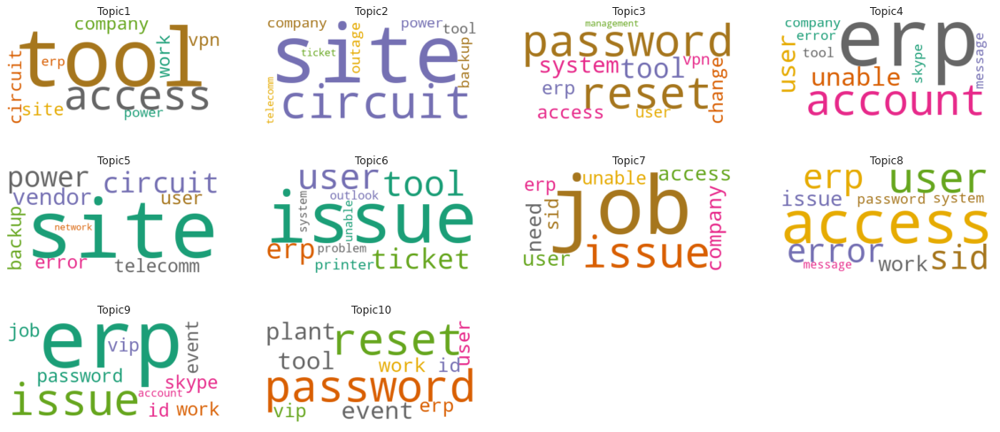

In [ ]:
# For Bayesian LDA
create_word_cloud(model_Lda, num_topics=10, topn=10)

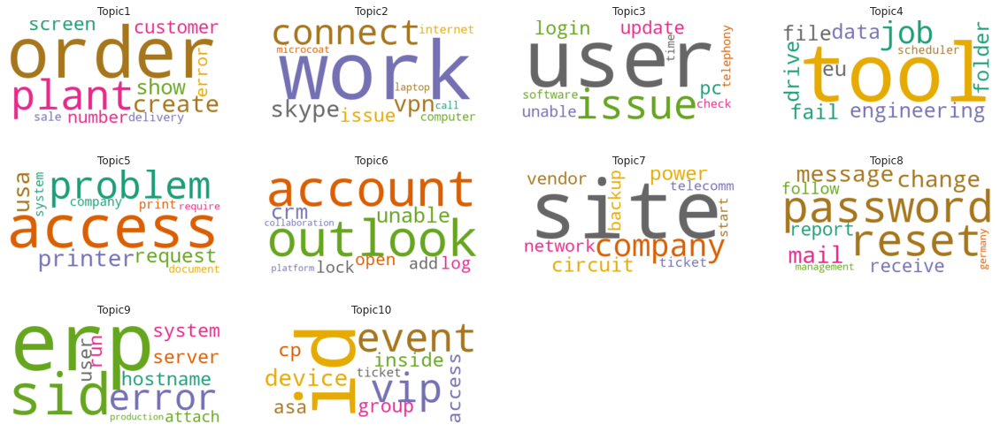

In [ ]:
# For LDA Mallet
create_word_cloud(model_LdaM, num_topics=10, topn=10)

## Visualization using pyLDAvis

In [ ]:
# Bayesian LDA
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model_Lda, corpus, dictionary=model_Lda.id2word)
pyLDAvis.save_html(vis, 'lda.html')
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.033985  0.010672       1        1  16.306690
5     -0.036397 -0.067688       2        1  11.419141
4      0.134112  0.008046       3        1  10.426897
8     -0.077154  0.004265       4        1  10.085109
1      0.127709 -0.009875       5        1   9.773057
6     -0.059723  0.075927       6        1   9.561903
3      0.020659 -0.071401       7        1   9.246363
9     -0.085205 -0.000890       8        1   8.061693
2     -0.059243 -0.006362       9        1   7.716536
0      0.069226  0.057306      10        1   7.402611, topic_info=         Term         Freq        Total Category  logprob  loglift
117        no  2411.000000  2411.000000  Default  30.0000  30.0000
12   password  1529.000000  1529.000000  Default  29.0000  29.0000
269   circuit   557.000000   557.000000  Default  28.0000  28.0000
61       site   694.000000   694.000000  Default  27.0000  27.0000
278     power   561.000000   561.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
88        erp    92.406330  1531.160671  Topic10  -4.6005  -0.2042
33      error    73.184009   953.075778  Topic10  -4.8337   0.0366
46        new    52.329348   383.646319  Topic10  -5.1691   0.6112
49     ticket    62.526491   794.846807  Topic10  -4.9911   0.0608
9       issue    61.257588  1226.561957  Topic10  -5.0116  -0.3935

[845 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
4522      1  0.016051  abended
4522      2  0.032102  abended
4522      3  0.048153  abended
4522      4  0.545739  abended
4522      5  0.048153  abended
...     ...       ...      ...
2084      5  0.123299     zarf
2084      9  0.739793     zarf
3625      5  0.804930     zeus
5409      5  0.199108     zinc
5409      7  0.597323     zinc

[2563 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 6, 5, 9, 2, 7, 4, 10, 3, 1])

#### pyLDAvis needs Bayesian LDA model to work. Below function will convert LDA Mallet to Bayesian LDA

In [ ]:
from gensim.models.ldamodel import LdaModel
def convertldaGenToldaMallet(mallet_model):
    model_gensim = LdaModel(
        id2word=mallet_model.id2word, num_topics=mallet_model.num_topics,
        alpha=mallet_model.alpha, eta=0,
    )
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

In [ ]:
pyLDAVis_lda_model = convertldaGenToldaMallet(model_LdaM)

import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(pyLDAVis_lda_model, corpus, dictionary=pyLDAVis_lda_model.id2word)
pyLDAvis.save_html(vis, 'lda_Mallet.html')
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9     -0.024252  0.208213       1        1  15.798177
6     -0.318607 -0.034769       2        1  12.818651
0      0.244290 -0.062648       3        1   9.515517
4     -0.138578  0.268570       4        1   9.243139
8      0.212642  0.190105       5        1   9.044582
7     -0.105246 -0.057212       6        1   8.935026
2      0.091725  0.033153       7        1   8.903884
5      0.024483 -0.178504       8        1   8.630739
3      0.123126 -0.166857       9        1   8.623204
1     -0.109583 -0.200051      10        1   8.487082, topic_info=           Term         Freq        Total Category  logprob  loglift
88          erp  1771.000000  1771.000000  Default  30.0000  30.0000
12     password  1690.000000  1690.000000  Default  29.0000  29.0000
31         tool  1512.000000  1512.000000  Default  28.0000  28.0000
28       access  1583.000000  1583.000000  Default  27.0000  27.0000
15         user  1547.000000  1547.000000  Default  26.0000  26.0000
..          ...          ...          ...      ...      ...      ...
111        call   266.652930   459.220710  Topic10  -3.6775   1.9230
9         issue   371.969628  1392.450255  Topic10  -3.3446   1.1466
71         home    67.223427    74.741987  Topic10  -5.0554   2.3606
255  connection   119.881776   386.909101  Topic10  -4.4769   1.2949
113       phone   109.798261   570.560215  Topic10  -4.5648   0.8187

[752 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
4522      9  0.998905     abended
2453      4  1.006957     ability
28        1  0.219119      access
28        4  0.781123      access
2782      6  1.088574  accordance
...     ...       ...         ...
689       9  0.998585       write
1589      3  0.989371       wrong
1589      6  0.009423       wrong
2084      2  0.960096        zarf
2497      4  1.118841       zirak

[856 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 7, 1, 5, 9, 8, 3, 6, 4, 2])

## t-SNE Clustering Chart

In [ ]:
!pip install bokeh

In [ ]:
# Get topic weights and dominant topics ------------
import matplotlib.colors as mcolors
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'm
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(model_Lda[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
#arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=123, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 10
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=700, plot_height=500)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6474 samples in 0.010s...
[t-SNE] Computed neighbors for 6474 samples in 0.195s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6474
[t-SNE] Computed conditional probabilities for sample 2000 / 6474
[t-SNE] Computed conditional probabilities for sample 3000 / 6474
[t-SNE] Computed conditional probabilities for sample 4000 / 6474
[t-SNE] Computed conditional probabilities for sample 5000 / 6474
[t-SNE] Computed conditional probabilities for sample 6000 / 6474
[t-SNE] Computed conditional probabilities for sample 6474 / 6474
[t-SNE] Mean sigma: 0.000008
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.660042
[t-SNE] KL divergence after 1000 iterations: 0.400748


In [ ]:
# Get topic weights and dominant topics ------------
import matplotlib.colors as mcolors
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'm
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

def tsne_cluster_chart(model, corpus, num_topics):
  # Get topic weights
  # n-1 rows each is a vector with i-1 posisitons, where n the number of documents
  # i the topic number and tmp[i] = probability of topic i
  print("number of topics: ", num_topics)
  topic_weights = []
  for row_list in model[corpus]:    
    tmp = np.zeros(num_topics)
    for i, w in row_list:
      if(i < num_topics):
        tmp[i] = w
    topic_weights.append(tmp)

  # Array of topic weights    
  arr = pd.DataFrame(topic_weights).fillna(0).values
  print("arr")

  # Keep the well separated points (optional)
  #arr = arr[np.amax(arr, axis=1) > 0.35]

  # Dominant topic number in each doc
  main_topic = np.argmax(arr, axis=1)
  #print(topic_num)

  # tSNE Dimension Reduction
  tsne_model = TSNE(n_components=2, verbose=1, random_state=123, angle=.99, init='pca')
  tsne_topic = tsne_model.fit_transform(arr)

  # Plot the Topic Clusters using Bokeh
  output_notebook()
  n_topics = num_topics
  mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
  plot = figure(title="t-SNE Clustering of {} Topics".format(n_topics), 
              plot_width=500, plot_height=300)
  #print("main topics: ", main_topic, "num of topics: ",num_topics)
  #print("x: ", tsne_topic[:,0], "y: ",tsne_topic[:,1])
  plot.scatter(x=tsne_topic[:,0], y=tsne_topic[:,1], color=mycolors[main_topic])
  show(plot)

In [ ]:
tsne_cluster_chart(model=model_LdaM, corpus=corpus, num_topics=10)

number of topics:  10
arr
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6474 samples in 0.007s...
[t-SNE] Computed neighbors for 6474 samples in 0.764s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6474
[t-SNE] Computed conditional probabilities for sample 2000 / 6474
[t-SNE] Computed conditional probabilities for sample 3000 / 6474
[t-SNE] Computed conditional probabilities for sample 4000 / 6474
[t-SNE] Computed conditional probabilities for sample 5000 / 6474
[t-SNE] Computed conditional probabilities for sample 6000 / 6474
[t-SNE] Computed conditional probabilities for sample 6474 / 6474
[t-SNE] Mean sigma: 0.012868
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.244141
[t-SNE] KL divergence after 1000 iterations: 1.603985


## HDP - Unigrams with BoW

In [ ]:
model_hdp = HdpModel(corpus=corpus,
                     id2word=id2word,
                     random_state=123)

coherencemodel_cv_hdp = CoherenceModel(model=model_hdp, texts=texts, dictionary=id2word, coherence='c_v')
print("Num Topics =", len(model_hdp.show_topics(num_topics=10,formatted=False)), " HDP has Coherence Value of", round(coherencemodel_cv_hdp.get_coherence(), 2))

Num Topics = 10  HDP has Coherence Value of 0.66


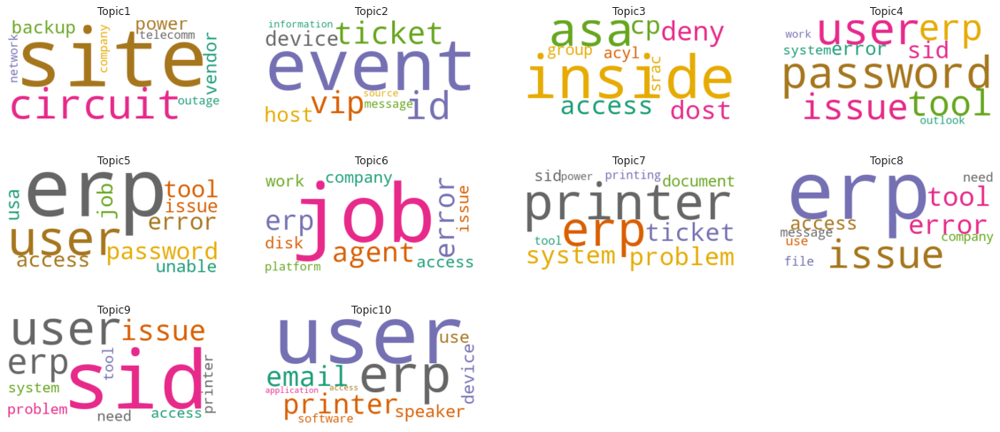

In [ ]:
# WordCloud For HDP
create_word_cloud(model_hdp, num_topics=10, topn=10)

In [ ]:
  tsne_cluster_chart(model=model_hdp, corpus=corpus, num_topics=10)

number of topics:  10
arr
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6474 samples in 0.034s...
[t-SNE] Computed neighbors for 6474 samples in 0.391s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6474
[t-SNE] Computed conditional probabilities for sample 2000 / 6474
[t-SNE] Computed conditional probabilities for sample 3000 / 6474
[t-SNE] Computed conditional probabilities for sample 4000 / 6474
[t-SNE] Computed conditional probabilities for sample 5000 / 6474
[t-SNE] Computed conditional probabilities for sample 6000 / 6474
[t-SNE] Computed conditional probabilities for sample 6474 / 6474
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.520596
[t-SNE] KL divergence after 1000 iterations: 0.285257


## NMF Model Unigrams with BoW

In [ ]:
num_topics = 10
model_nmf = Nmf(corpus=corpus,
               num_topics=num_topics,
               id2word=id2word,
               random_state=123)

coherencemodel_cv_nmf = CoherenceModel(model=model_nmf, texts=texts, dictionary=id2word, coherence='c_v')
print("Num Topics =", num_topics, " NMF has Coherence Value of", round(coherencemodel_cv_nmf.get_coherence(), 2))

Num Topics = 10  NMF has Coherence Value of 0.65


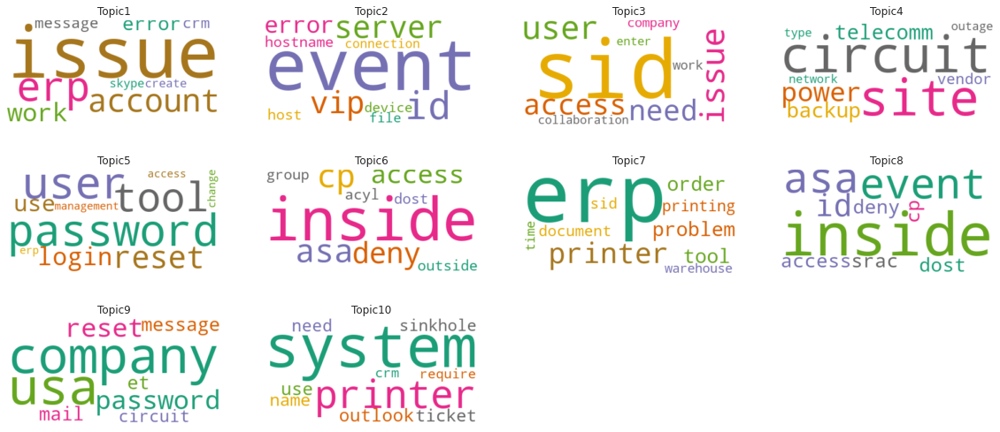

In [ ]:
# WordCloud For NMF
create_word_cloud(model_nmf, num_topics=10, topn=10)

In [ ]:
tsne_cluster_chart(model=model_nmf, corpus=corpus, num_topics=10)

number of topics:  10
arr
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6474 samples in 0.009s...
[t-SNE] Computed neighbors for 6474 samples in 0.350s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6474
[t-SNE] Computed conditional probabilities for sample 2000 / 6474
[t-SNE] Computed conditional probabilities for sample 3000 / 6474
[t-SNE] Computed conditional probabilities for sample 4000 / 6474
[t-SNE] Computed conditional probabilities for sample 5000 / 6474
[t-SNE] Computed conditional probabilities for sample 6000 / 6474
[t-SNE] Computed conditional probabilities for sample 6474 / 6474
[t-SNE] Mean sigma: 0.048503
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.879372
[t-SNE] KL divergence after 1000 iterations: 1.157384


## LDA Mallet with Bigrams and Bag of Words

In [ ]:
num_topics = 10
model_LdaM_bi = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus_bigram, 
                                                 num_topics=num_topics, 
                                                 id2word=id2word_bigram, 
                                                 random_seed=123,
                                                 iterations=1000,
                                                 )

coherencemodel_cv_LdaM_bi = CoherenceModel(model=model_LdaM_bi, texts=texts_bigram, dictionary=id2word_bigram, coherence='c_v')
print("Num Topics =", num_topics, " LDA Mallet Bigram/BoW has Coherence Value of", round(coherencemodel_cv_LdaM_bi.get_coherence(), 2))

Num Topics = 10  LDA Mallet Bigram/BoW has Coherence Value of 0.47


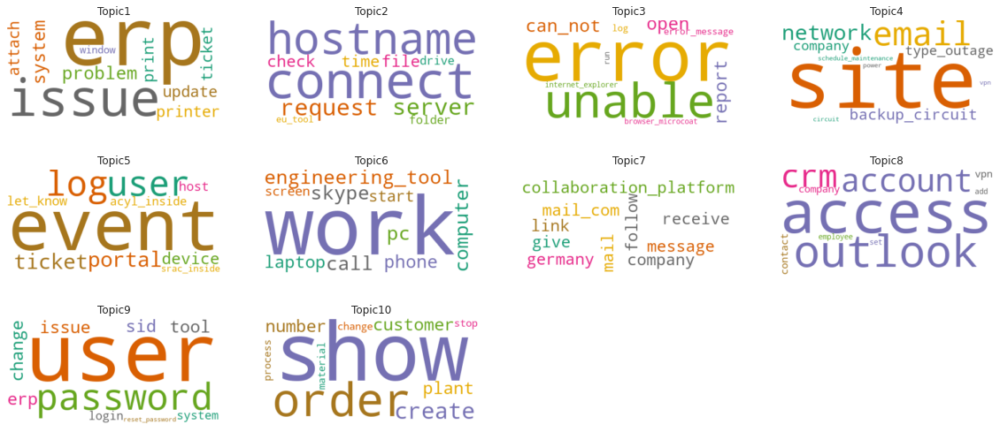

In [ ]:
# WordCloud For LDA Mallet Bigram
create_word_cloud(model_LdaM_bi, num_topics=10, topn=10)

In [ ]:
pyLDAVis_lda_model = convertldaGenToldaMallet(model_LdaM_bi)

import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(pyLDAVis_lda_model, corpus_bigram, dictionary=pyLDAVis_lda_model.id2word)
pyLDAvis.save_html(vis, 'lda_Mallet_bi.html')
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.016892 -0.129921       1        1  13.963409
3     -0.201191  0.278357       2        1  10.807867
9      0.039562 -0.113569       3        1  10.151719
6     -0.143062 -0.031524       4        1   9.632013
0      0.285208  0.113035       5        1   9.599210
1     -0.053900 -0.206577       6        1   9.405150
7     -0.201475  0.205950       7        1   9.340879
8      0.322678  0.141564       8        1   9.061523
5     -0.072568 -0.157211       9        1   9.047955
2      0.007856 -0.100104      10        1   8.990276, topic_info=         Term         Freq        Total Category  logprob  loglift
85        erp  1640.000000  1640.000000  Default  30.0000  30.0000
22     access  1140.000000  1140.000000  Default  29.0000  29.0000
10       user  1221.000000  1221.000000  Default  28.0000  28.0000
78       work   945.000000   945.000000  Default  27.0000  27.0000
121  password   822.000000   822.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
362       run   182.576122   200.648844  Topic10  -3.9241   2.3146
181  log_into   100.363479   106.802936  Topic10  -4.5225   2.3468
177     today   115.311233   138.532902  Topic10  -4.3836   2.2256
20        log   219.945502   404.545457  Topic10  -3.7379   1.7996
530      find    96.092688   122.927369  Topic10  -4.5660   2.1627

[743 rows x 6 columns], token_table=      Topic      Freq          Term
term                               
5186     10  1.000094   abended_job
243       8  0.994922    able_login
22        7  0.999838        access
3655      1  1.004173  access_group
184       7  1.000756       account
...     ...       ...           ...
2579      3  0.925478      wrongful
2778     10  1.053670            xd
2627      4  0.861265          yhwh
2385      2  0.949160          zarf
2752      5  0.973262         zebra

[823 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 4, 10, 7, 1, 2, 8, 9, 6, 3])

In [ ]:
# T_SNE Cluster for LDA Mallet Bigrams
tsne_cluster_chart(model=model_LdaM_bi, corpus=corpus_bigram, num_topics=10)

number of topics:  10
arr
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6474 samples in 0.006s...
[t-SNE] Computed neighbors for 6474 samples in 0.800s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6474
[t-SNE] Computed conditional probabilities for sample 2000 / 6474
[t-SNE] Computed conditional probabilities for sample 3000 / 6474
[t-SNE] Computed conditional probabilities for sample 4000 / 6474
[t-SNE] Computed conditional probabilities for sample 5000 / 6474
[t-SNE] Computed conditional probabilities for sample 6000 / 6474
[t-SNE] Computed conditional probabilities for sample 6474 / 6474
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.654953
[t-SNE] KL divergence after 1000 iterations: 1.518306


------------------------------------------

## LDA Mallet with Unigrams and TF-IDF

In [ ]:
num_topics = 10
model_LdaM_tfidf = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus_tfidf, 
                                                 num_topics=num_topics, 
                                                 id2word=id2word, 
                                                 random_seed=123,
                                                 iterations=1000,
                                                 )

coherencemodel_cv_LdaM_tfidf = CoherenceModel(model=model_LdaM_tfidf, texts=texts, dictionary=id2word, coherence='c_v')
print("Num Topics =", num_topics, " LDA Mallet Unigrams/TFIDF has Coherence Value of", round(coherencemodel_cv_LdaM_tfidf.get_coherence(), 2))

Num Topics = 10  LDA Mallet Unigrams/TFIDF has Coherence Value of 0.4


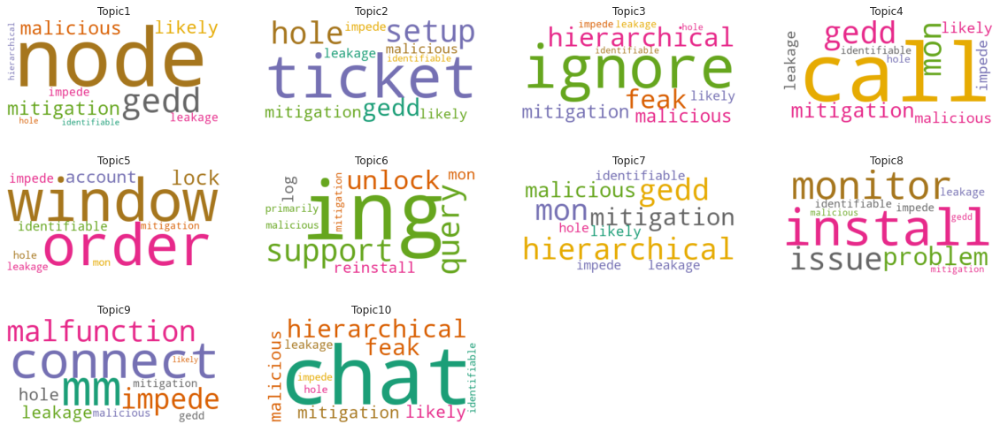

In [ ]:
# WordCloud For LDA Mallet Bigram
create_word_cloud(model_LdaM_tfidf, num_topics=10, topn=10)

In [ ]:
# T_SNE Cluster for LDA Mallet Unigrams/TFIDF
tsne_cluster_chart(model=model_LdaM_tfidf, corpus=corpus_tfidf, num_topics=10)

number of topics:  10
arr
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6474 samples in 0.044s...
[t-SNE] Computed neighbors for 6474 samples in 0.792s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6474
[t-SNE] Computed conditional probabilities for sample 2000 / 6474
[t-SNE] Computed conditional probabilities for sample 3000 / 6474
[t-SNE] Computed conditional probabilities for sample 4000 / 6474
[t-SNE] Computed conditional probabilities for sample 5000 / 6474
[t-SNE] Computed conditional probabilities for sample 6000 / 6474
[t-SNE] Computed conditional probabilities for sample 6474 / 6474
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.395866
[t-SNE] KL divergence after 1000 iterations: 0.295548


## Finding the Optimal count of Topics based on coherence score

In [ ]:
#Find the best coherence value with LDAMallet.
def compute_coherence_values_LdaM(dictionary, corpus, texts, start=2, limit=40, step=2):
    coherence_cv_values = []
    model_list = []
    
    for num_topics in range(start, limit, step):
        model_LdaM = gensim.models.wrappers.LdaMallet(mallet_path, 
                                                 corpus=corpus, 
                                                 num_topics=num_topics, 
                                                 id2word=dictionary, 
                                                 random_seed=123,
                                                 alpha=0.1,
                                                 optimize_interval=10,
                                                 #,topic_threshold=0.20
                                                 )
        
        model_list.append(model_LdaM)

        # With C_V coherence value
        coherencemodel_cv_LdaM = CoherenceModel(model=model_LdaM, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_cv_values.append(coherencemodel_cv_LdaM.get_coherence())

    return model_list, coherence_cv_values

# Plot graph
def plot_coherence_graph(coherence_values, start=2, limit=40, step=2):
  x = range(start, limit, step)
  
  fig = plt.figure(figsize=(10,4))
  ax = fig.add_subplot(111)
  plt.plot(x, coherence_values)
  for xy in zip(x, coherence_values):
        ax.annotate('(Topic count:%s,  cv:%0.2f)' % xy, xy=xy, textcoords='data')
  plt.xlabel("Num Topics")
  plt.ylabel("Coherence score")
  plt.legend(("coherence_values"), loc='best')
  plt.show()

# Listing the Coherence score against Topic count
def print_cv_values(coherence_values, start, limit, step):
  x = range(start, limit, step)
  for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 2))

In [ ]:
# Running experiments
import random
random_seed=123
%time model_list_LdaM, coherence_values_LdaM = compute_coherence_values_LdaM(dictionary=id2word, corpus=corpus, texts=texts, start=6, limit=20, step=2)

CPU times: user 10.7 s, sys: 1.13 s, total: 11.8 s
Wall time: 4min 22s


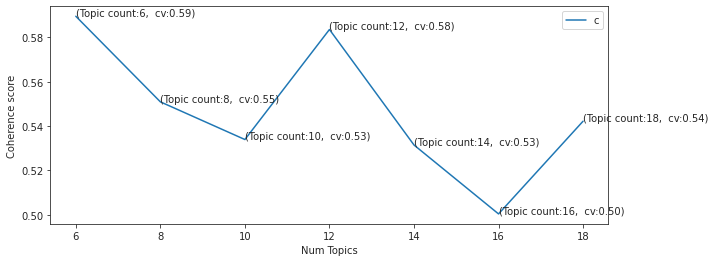

Num Topics = 6  has Coherence Value of 0.59
Num Topics = 8  has Coherence Value of 0.55
Num Topics = 10  has Coherence Value of 0.53
Num Topics = 12  has Coherence Value of 0.58
Num Topics = 14  has Coherence Value of 0.53
Num Topics = 16  has Coherence Value of 0.5
Num Topics = 18  has Coherence Value of 0.54


In [ ]:
plot_coherence_graph(coherence_values_LdaM, start=6, limit=20, step=2)
print_cv_values(coherence_values_LdaM, start=6, limit=20, step=2)

In [ ]:
# Initialize numberof topics to model with best coherence score

num = 10
num_array = int((num/2)-3)

# LDAM and unigram words
optimal_model_LdaM = model_list_LdaM[num_array]
model_topics_LdaM = optimal_model_LdaM.show_topics(formatted=False)
print(len(model_topics_LdaM))
#print(optimal_model_LdaM.print_topics(num_words=10))

10


In [ ]:
def format_topics_sentences(model, corpus=corpus, texts=texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(model[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = model.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [ ]:
# selecting Top 10 keywords
topics = [[(term, round(wt, 3)) for term, wt in optimal_model_LdaM.show_topic(n, topn=10)] for n in range(0, optimal_model_LdaM.num_topics)]

# set column width
pd.set_option('display.max_colwidth', None)
topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], columns = ['Terms per Topic'], index=['Topic'+str(t) for t in range(1, optimal_model_LdaM.num_topics+1)] )
topics_df


,Terms per Topic
Topic1,"tool, access, unable, error, outlook, engineering, crm, issue, open, collaboration"
Topic2,"hostname, server, access, erp, drive, space, slow, time, folder, tool"
Topic3,"event, inside, id, cp, vip, asa, host, deny, source, device"
Topic4,"work, skype, connect, vpn, pc, laptop, issue, outlook, phone, call"
Topic5,"printer, print, erp, problem, printing, document, ticket, driver, error, system"
Topic6,"job, company, scheduler, fail, usa, hostname, access, sw, interface, switch"
Topic7,"circuit, site, power, telecomm, vendor, backup, outage, network, company, maintenance"
Topic8,"password, reset, erp, tool, account, change, lock, user, management, message"
Topic9,"order, plant, erp, error, tool, create, delivery, issue, warehouse, customer"
Topic10,"user, sid, erp, issue, account, access, login, system, id, error"


In [ ]:
# Getting Most Dominant topics in each document from the corpus
tm_results = optimal_model_LdaM[corpus]
tm_results

corpus_topics = [sorted(topics, key=lambda record: -record[1])[0] for topics in tm_results]

# create a dataframe
corpus_topic_df = pd.DataFrame()

# get the Incident description from the original dataframe
corpus_topic_df['Original_Description'] = df.Clean_Description
corpus_topic_df['Dominant Topic'] = [item[0]+1 for item in corpus_topics]
corpus_topic_df['Contribution %'] = [round(item[1]*100, 2) for item in corpus_topics]
corpus_topic_df['Topic Terms'] = [topics_df.iloc[t[0]]['Terms per Topic'] for t in corpus_topics]



dominant_topic_df = corpus_topic_df.groupby('Dominant Topic').agg(
                                  Doc_Count = ('Dominant Topic', np.size),
                                  Total_Docs_Perc = ('Dominant Topic', np.size)).reset_index()

dominant_topic_df['Total_Docs_Perc'] = dominant_topic_df['Total_Docs_Perc'].apply(lambda row: round((row*100) / len(corpus), 2))

dominant_topic_df

,Dominant Topic,Doc_Count,Total_Docs_Perc
0,1,1628,25.15
1,2,570,8.80
2,3,65,1.00
3,4,1402,21.66
4,5,340,5.25
5,6,321,4.96
6,7,151,2.33
7,8,825,12.74
8,9,701,10.83
9,10,471,7.28


In [ ]:
corpus_topic_df.head()

,Original_Description,Dominant Topic,Contribution %,Topic Terms
0,verified user details employee name checked user name ad reset password advised user login check caller confirmed able login issue resolved login issue,10,94.87,"user, sid, erp, issue, account, access, login, system, id, error"
1,meetings skype meetings appearing outlook calendar somebody advise correct outlook,4,93.43,"work, skype, connect, vpn, pc, laptop, issue, outlook, phone, call"
2,cannot log vpn log vpn,4,69.88,"work, skype, connect, vpn, pc, laptop, issue, outlook, phone, call"
3,unable access hr tool page,1,94.24,"tool, access, unable, error, outlook, engineering, crm, issue, open, collaboration"
4,skype error,4,58.75,"work, skype, connect, vpn, pc, laptop, issue, outlook, phone, call"


In [ ]:
def plot_word_cloud_cluster_topics(model, num_topics, corpus, texts):
  
  create_word_cloud(model=model, num_topics=num_topics, topn=10)
  df_topic_sents_keywords = format_topics_sentences(model=model, corpus=corpus, texts=texts)
  # Format
  df_dominant_topic = df_topic_sents_keywords.reset_index()
  df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

  # Show
  from tabulate import tabulate
  print("\n",tabulate(df_dominant_topic.head(10), headers='keys', tablefmt='psql'))

  #plot the cluster
  tsne_cluster_chart(model=model, corpus=corpus, num_topics=num_topics)

  #plot pyLDAvis
  pyLDAVis_lda_model = convertldaGenToldaMallet(optimal_model_LdaM)

  pyLDAvis.enable_notebook()
  vis = pyLDAvis.gensim.prepare(pyLDAVis_lda_model, corpus, dictionary=pyLDAVis_lda_model.id2word)
  pyLDAvis.display(vis)
  pyLDAvis.save_html(vis, 'lda_Mallet_optimal_10.html')
  

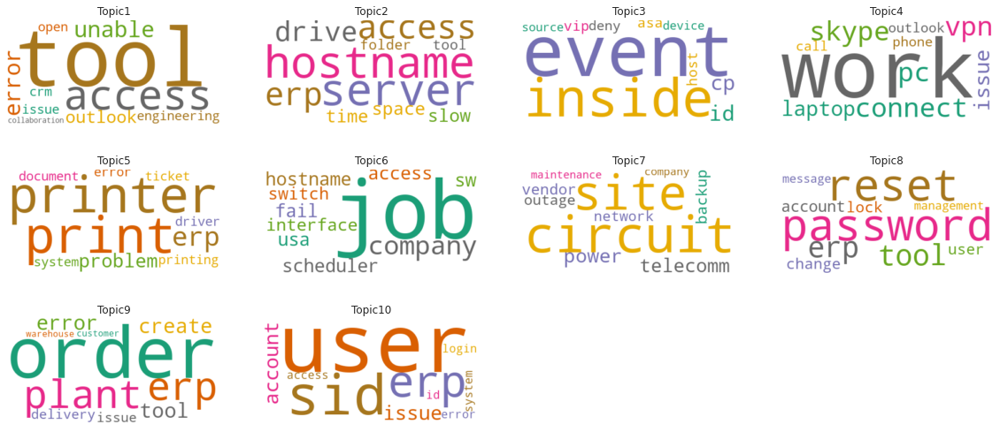


 +----+---------------+------------------+----------------------+------------------------------------------------------------------------------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|    |   Document_No |   Dominant_Topic |   Topic_Perc_Contrib | Keywords                                                                           | Text                                                                                                                                                                                                                   |
|----+---------------+------------------+----------------------+------------------------------------------------------------------------------------+-------------------------------------------------------------------------------------------------------------------

In [ ]:
#Plot and display main topics for LdaM with unigram 
plot_word_cloud_cluster_topics(model=optimal_model_LdaM, num_topics=num, corpus=corpus,texts=texts)

## VERIFY TEXT CLASSIFICATION USING SUPERVISED LEARNING ON 10 TOPICS OUTPUT GENERATED FROM TOPIC MODELLING

In [ ]:
df_dom_topic_keywords = format_topics_sentences(model=optimal_model_LdaM, corpus=corpus, texts=texts)

In [ ]:
df_dom_topic = df_dom_topic_keywords.reset_index()
df_dom_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

In [ ]:
df_dom_topic.isnull().sum()

Document_No           0
Dominant_Topic        0
Topic_Perc_Contrib    0
Keywords              0
Text                  0
dtype: int64

In [ ]:
df_dom_topic.dropna(inplace=True)

In [ ]:
df_dom_topic['text_string'] = df_dom_topic.Text.apply(lambda x: ', '.join([str(i) for i in x]))

In [ ]:
# Featre Engineering
df_dom_topic["Combined"] = df_dom_topic["Keywords"] + " " + df_dom_topic["text_string"].astype(str)

# Without Featre Engineering
df_dom_topic["lem_text_string"] = df_dom_topic["text_string"].astype(str)

In [ ]:
df_dom_topic.drop(['Document_No', 'Topic_Perc_Contrib', 'Keywords', 'Text', 'text_string'], axis=1, inplace=True)
df_dom_topic['lem_text_string']=df_dom_topic['lem_text_string'].str.replace(',','')
df_dom_topic['Combined']=df_dom_topic['Combined'].str.replace(',','')
df_dom_topic['Target'] = df_dom_topic['Dominant_Topic'].astype('category').cat.codes
df_dom_topic.head()

,Dominant_Topic,Combined,lem_text_string,Target
0,5.0,password sid erp user reset account job tool login lock verify user detail employee name checked user name ad reset password advise user login check caller confirm able login issue resolve login issue,verify user detail employee name checked user name ad reset password advise user login check caller confirm able login issue resolve login issue,5
1,7.0,outlook crm email issue software phone mail user update unable meeting skype meeting appear outlook calendar somebody advise correct outlook,meeting skype meeting appear outlook calendar somebody advise correct outlook,7
2,9.0,work tool connect issue unable vpn skype engineering computer internet can not log vpn log vpn,can not log vpn log vpn,9
3,9.0,work tool connect issue unable vpn skype engineering computer internet unable access hr tool page,unable access hr tool page,9
4,9.0,work tool connect issue unable vpn skype engineering computer internet skype error,skype error,9


In [ ]:
x = df_dom_topic['lem_text_string']
x_combined=df_dom_topic['Combined']
y=df_dom_topic['Target']

x_train_opt, x_test_opt, y_train_opt, y_test_opt = train_test_split(x,y,test_size=0.20,random_state=42)
x_comb_train, x_comb_test, y_train, y_test = train_test_split(x_combined,y,test_size=0.20,random_state=42)
print('Shape of the training set:', x_train.shape, x_test.shape)
print('Shape of the test set:', y_train.shape, y_test.shape)

Shape of the training set: (5179,) (1295,)
Shape of the test set: (5179,) (1295,)


In [ ]:
%time
tfidf_vectorizer = TfidfVectorizer()
run_supervised_ml_models(tfidf_vectorizer, x_train_opt, y_train_opt, x_test_opt, y_test_opt)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.34 µs

converted the input data into vector form

x_train : (5179, 5122), y_train : (5179,), x_test : (1295, 5122), y_test : (1295,)

Stochastic Gradient Descent Classifier executed

Multinomial Naive Bayes Classifier executed

Random Forest Classifier executed

Linear SVC executed

RBF SVC executed

KNN classifier executed

XGBoost Classifier executed

Training accuracy, Test Accuracy, F1 score, Cohen Kappa score, Cross_Val_F1 score for the model

        Model  Train_Acc  Test_Acc  F1_Score  Cohen_Kappa  CV_F1
0     SGD_Clf       0.99      0.87      0.87         0.84   0.83
1     MNB_Clf       0.86      0.78      0.79         0.74   0.76
2     RFC_Clf       1.00      0.76      0.76         0.72   0.76
3  linear_SVC       0.99      0.86      0.86         0.84   0.84
4     RBF_SVC       0.98      0.84      0.84         0.81   0.82
5         KNN       1.00      0.75      0.75         0.70   0.74
6     XGB_Clf       0.82      0.74

In [ ]:
%time
tfidf_vectorizer = TfidfVectorizer()
run_supervised_ml_models(tfidf_vectorizer, x_comb_train, y_train, x_comb_test, y_test)

CPU times: user 0 ns, sys: 5 µs, total: 5 µs
Wall time: 11 µs

converted the input data into vector form

x_train : (5179, 5122), y_train : (5179,), x_test : (1295, 5122), y_test : (1295,)

Stochastic Gradient Descent Classifier executed

Multinomial Naive Bayes Classifier executed

Random Forest Classifier executed

Linear SVC executed

RBF SVC executed

KNN classifier executed

XGBoost Classifier executed

Training accuracy, Test Accuracy, F1 score, Cohen Kappa score, Cross_Val_F1 score for the model

        Model  Train_Acc  Test_Acc  F1_Score  Cohen_Kappa  CV_F1
0     SGD_Clf        1.0      1.00      1.00         1.00   1.00
1     MNB_Clf        1.0      1.00      1.00         1.00   0.99
2     RFC_Clf        1.0      1.00      1.00         1.00   1.00
3  linear_SVC        1.0      1.00      1.00         1.00   1.00
4     RBF_SVC        1.0      1.00      1.00         1.00   1.00
5         KNN        1.0      0.98      0.98         0.98   0.99
6     XGB_Clf        1.0      1.00  

In [ ]:
def svc_model_tuning(x_train, y_train, x_test, y_test):
  tfidf_vectorizer = TfidfVectorizer()
  x_train = tfidf_vectorizer.fit_transform(x_train)
  x_test = tfidf_vectorizer.transform(x_test)
  print("\nconverted the input data into vector form\n") 

  svc = SVC(random_state=13)
  random_grid = {'C': [0.1, 1, 10, 100],  
              'gamma': [0.1, 0.01, 0.001, 0.0001], 
              'kernel': ['rbf', 'linear'],
              'class_weight' : ['balanced', None]}
  
  cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=13)

  scorer = metrics.make_scorer(metrics.accuracy_score)
  rf_random = RandomizedSearchCV(estimator = svc, param_distributions=random_grid, scoring=scorer, cv=cv, verbose=1, random_state=13, n_jobs=-1)
    
  rf_random.fit(x_train,y_train)
  print("\SVC result with shape of data : ", x_train.shape, y_train.shape)
  print("Results with RandomizedSearchCV")
  print(rf_random.best_estimator_.get_params())
  print("\ntrain score",rf_random.best_estimator_.score(x_test, y_test)) 
  print("\ntest score",rf_random.best_estimator_.score(x_train, y_train))

In [ ]:
def sgd_model_tuning(x_train, y_train, x_test, y_test):
  tfidf_vectorizer = TfidfVectorizer()
  x_train = tfidf_vectorizer.fit_transform(x_train)
  x_test = tfidf_vectorizer.transform(x_test)
  print("\nconverted the input data into vector form\n") 

  sgd = SGDClassifier(random_state=13)
  random_grid = {'loss' : ['hinge', 'log', 'modified_huber'],
              'max_iter': [1000, 2000, 5000],  
              'alpha': [0.01, 0.001, 0.0001, 0.00001], 
              #'penatly': ['elasticnet', 'l1', 'l2'],
              'eta0':[0.50, 1.0, 5.0],
              'learning_rate': ['constant', 'optimal', 'adaptive'],
              'class_weight' : ['balanced', None]}
  
  cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=23)

  scorer = metrics.make_scorer(metrics.accuracy_score)
  rf_random = RandomizedSearchCV(estimator = sgd, param_distributions=random_grid, scoring=scorer, cv=cv, verbose=1, random_state=13, n_jobs=-1)
    
  rf_random.fit(x_train,y_train)
  print("\SGD result with shape of data : ", x_train.shape, y_train.shape)
  print("Results with RandomizedSearchCV")
  print(rf_random.best_estimator_.get_params())
  print("\ntrain score",rf_random.best_estimator_.score(x_test, y_test)) 
  print("\ntest score",rf_random.best_estimator_.score(x_train, y_train))

In [ ]:
svc_model_tuning(x_train_opt, y_train_opt, x_test_opt, y_test_opt)


converted the input data into vector form

Fitting 15 folds for each of 10 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:  7.3min finished


\SVC result with shape of data :  (5179, 5122) (5179,)
Results with RandomizedSearchCV
{'C': 100, 'break_ties': False, 'cache_size': 200, 'class_weight': 'balanced', 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 0.01, 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': 13, 'shrinking': True, 'tol': 0.001, 'verbose': False}

train score 0.8555984555984556

test score 0.9754778914848427


In [ ]:
sgd_model_tuning(x_train_opt, y_train_opt, x_test_opt, y_test_opt)


converted the input data into vector form

Fitting 15 folds for each of 10 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:   20.5s finished


\SGD result with shape of data :  (5179, 5122) (5179,)
Results with RandomizedSearchCV
{'alpha': 1e-05, 'average': False, 'class_weight': 'balanced', 'early_stopping': False, 'epsilon': 0.1, 'eta0': 5.0, 'fit_intercept': True, 'l1_ratio': 0.15, 'learning_rate': 'adaptive', 'loss': 'log', 'max_iter': 2000, 'n_iter_no_change': 5, 'n_jobs': None, 'penalty': 'l2', 'power_t': 0.5, 'random_state': 13, 'shuffle': True, 'tol': 0.001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}

train score 0.8679536679536679

test score 0.9936281135354316


In [ ]:
print_classification_score(SGDClassifier(loss='log', alpha=1e-05, max_iter = 2000, class_weight='balanced', eta0=5.0, learning_rate='adaptive', n_jobs=-1, random_state=13), 
                                         x_train_opt, y_train_opt, x_test_opt, y_test_opt)

x_test_shape (1295,) x_train_shape
 (5179,)
Cohen kappa score:
 0.843828347646159
----------------------------------------------------------------------------------------------------
Training accuracy: 99.363%
----------------------------------------------------------------------------------------------------
Testing accuracy: 86.795%
----------------------------------------------------------------------------------------------------
cohen_kappa score: 84.383%
----------------------------------------------------------------------------------------------------
cross validation f1 weighted score: 0.8462011484092107
----------------------------------------------------------------------------------------------------
Confusion matrix:
 [[ 21   0   0   0   0   0   0   0   0   1]
 [  0  32   2   2   1   1   0   1   0   2]
 [  0   0  80   1   5   1   0   2   0   4]
 [  1   1   3 118   4   2   1   8   2   1]
 [  0   1   6   3 115   3   0   8   2   8]
 [  0   0   2   2   2 243   0   6   0   4]
 

,precision,recall,f1-score,support
0,0.954545,0.954545,0.954545,22.000000
1,0.780488,0.780488,0.780488,41.000000
2,0.842105,0.860215,0.851064,93.000000
3,0.855072,0.836879,0.845878,141.000000
4,0.798611,0.787671,0.793103,146.000000
5,0.941860,0.938224,0.940039,259.000000
6,0.888889,0.888889,0.888889,9.000000
7,0.828054,0.835616,0.831818,219.000000
8,0.884058,0.847222,0.865248,72.000000
9,0.882550,0.897611,0.890017,293.000000
